In [1]:
import numpy as np
import scipy.integrate
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from scipy.stats import spearmanr

# Dados batelada
Somente para extrair condições iniciais e tempo

In [2]:
df = pd.read_csv("../dados/bat_data.csv")
df

,apa_t,apa_mm,amox_t,amox_mm,ester_t,ester_mm,aoh_t,aoh_mm
0,0.0,60.00000,0.0,0.000000,0.0,20.000000,0.0,0.000000
1,30.0,59.81431,30.0,0.155106,30.0,18.986957,30.0,0.822901
2,60.0,59.73249,60.0,0.215833,60.0,18.747155,60.0,0.973603
3,90.0,59.80909,90.0,0.282864,90.0,18.369786,90.0,1.184325
4,120.0,59.65543,120.0,0.458630,120.0,17.961840,120.0,1.272074
5,187.5,59.59763,187.5,0.603443,187.5,17.285627,187.5,1.636247
6,240.0,59.38548,240.0,0.725315,240.0,16.719786,240.0,1.888615
7,300.0,59.28374,300.0,0.911769,300.0,16.075576,300.0,2.266852
8,360.0,58.99810,360.0,1.188997,360.0,15.035050,360.0,2.752346
9,420.0,58.73914,420.0,1.387558,420.0,14.085256,420.0,3.340910


In [3]:
CAB_medida  = df.loc[:,'ester_mm'].dropna().to_numpy()
CAN_medida = df.loc[:,'amox_mm'].dropna().to_numpy()
CNH_medida = df.loc[:,'apa_mm'].dropna().to_numpy()
CAOH_medida = df.loc[:,'aoh_mm'].dropna().to_numpy()
t = df.loc[:,'amox_t'].dropna().to_numpy()
t = np.sort(np.unique(np.append(np.linspace(t[0],t[-1],100),t)))
CI = np.array([CAB_medida[0],CAN_medida[0],CNH_medida[0],CAOH_medida[0]])

# Funções para analisar a sensibilidade
- Resolve o modelo com vários pontos no alcance informado para as condições iniciais informadas
- calcula o PRCC de cada parâmetro para cada substância em cada ponto no tempo
- calcula o SRC de cada parâmetro para cada substância em cada ponto no tempo

In [4]:
def sensitivity_analysis(params, param_ranges, y0, t,solver):
    sensitivity_results = {}
    
    for i in range(len(params)):
        param_values = np.linspace(param_ranges[i][0], param_ranges[i][1], 2000)
        outputs = []
        print(f"evaluating {labels[i]}")
        
        for value in param_values:
            temp_params = np.array(params, copy=True)
            temp_params[i] = value
            solution = solver(temp_params, y0, t)
            # Measure the output at the last time point (or any specific point)
            outputs.append(solution)
        
        sensitivity_results[f'param_{i}'] = {
            'values': param_values,
            'outputs': np.array(outputs)
        }
    
    return sensitivity_results

In [5]:


def prcc_analysis(sensitivity_results, t):
    prcc_values = {}

    for i in range(len(base_params)):
        outputs = sensitivity_results[f'param_{i}']['outputs']
        param_values = sensitivity_results[f'param_{i}']['values']
        
        # Calculate PRCC for each time point
        prcc_time_series = []
        for time_point in range(outputs.shape[2]):
            prcc_time_point = []
            for state_variable in range(outputs.shape[1]):
                # Extract the outputs for the current time point and state variable
                y = outputs[:, state_variable, time_point]
                
                # Check if the input array is constant
                if np.all(y == y[0]):
                    prcc_time_point.append(np.nan)  # Append NaN if the array is constant
                else:
                    # Compute Spearman rank correlation
                    corr, _ = spearmanr(param_values, y)
                    prcc_time_point.append(corr)
            prcc_time_series.append(prcc_time_point)
        
        prcc_values[f'param_{i}'] = np.array(prcc_time_series)
    
    return prcc_values

In [6]:
def src_analysis(sensitivity_results, t):
    src_values = {}

    for i in range(len(base_params)):
        outputs = sensitivity_results[f'param_{i}']['outputs']
        param_values = sensitivity_results[f'param_{i}']['values']
        
        # Standardize the parameter values
        scaler = StandardScaler()
        param_values_standardized = scaler.fit_transform(param_values.reshape(-1, 1)).flatten()
        
        # Calculate SRC for each time point
        src_time_series = []
        for time_point in range(outputs.shape[2]):
            src_time_point = []
            for state_variable in range(outputs.shape[1]):
                # Extract the outputs for the current time point and state variable
                y = outputs[:, state_variable, time_point]
                y_standardized = scaler.fit_transform(y.reshape(-1, 1)).flatten()
                
                # Fit linear regression model
                reg = LinearRegression().fit(param_values_standardized.reshape(-1, 1), y_standardized)
                src_time_point.append(reg.coef_[0])
            src_time_series.append(src_time_point)
        
        src_values[f'param_{i}'] = np.array(src_time_series)
    
    return src_values

# Funções de plotagem
- Plotagem com sombreamento de distribuição
- Plotagem de heatmap (descontinuada)
- Plotagem de menor densidade

In [7]:
# Plot summary statistics with shading in subplots
def plot_summary_statistics_with_shading(sensitivity_results, param_name, state_vars):
    plt.figure(figsize=(12, 8))
    for j, state_var in enumerate(state_vars):
        plt.subplot(2, 2, j + 1)
        data = sensitivity_results[:, j, :]
        mean = np.mean(data, axis=0)
        std = np.std(data, axis=0)
        plt.plot(t, mean, label=state_var)
        plt.fill_between(t, mean - std, mean + std, alpha=0.3)
        plt.xlabel('Time')
        plt.ylabel(state_var)
        plt.title(f'Sensitivity of {param_name} on {state_var}')
        plt.legend()
    plt.tight_layout()
    plt.show()

In [8]:
# Plot heatmaps of the sensitivity analysis results
def plot_heatmap(data, title, xlabel, ylabel):
    plt.figure(figsize=(6, 4))
    sns.heatmap(data, cmap='viridis', xticklabels=False, yticklabels=False)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

In [9]:
def plot_reduced_density(sensitivity_results, param_idx, param_name, state_vars):
    plt.figure(figsize=(12, 8))
    for j, state_var in enumerate(state_vars):
        plt.subplot(2, 2, j + 1)
        param_values = sensitivity_results[f'param_{param_idx}']['values']
        outputs = sensitivity_results[f'param_{param_idx}']['outputs']
        for k in range(0, len(param_values), 10):  # Plot every 10th line to reduce density
            plt.plot(t, outputs[k, j, :], label=f'{param_values[k]:.2f}' if k < 100 else "")
        plt.xlabel('Time')
        plt.ylabel(state_var)
        plt.title(f'Sensitivity of {param_name} on {state_var}')
        if j == 0:
            plt.legend(title='Parameter Value', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Avaliação do Modelo 2
- Definição do modelo
- Ode15s

In [10]:
def enzymic_amox_bat(t, y, params):
    k2, k3, k4, k5, KS, KP, KN, kmenos4 = params
    CAB, CAN, CNH, CAOH = y
    Cez = 1.0  # Assuming Cez is constant and known

    RP = (Cez) / (k3 * KN + k4 * CNH + k5 * CNH) * ((k2 * k4 * CAB * CNH) / (KS) - (kmenos4 * CAN * (k3 * KN + k5 * CNH) / KP))
    RB = Cez * (k3 * KN + k5 * CNH) / (k3 * KN + k4 * CNH + k5 * CNH) * ((k2 * CAB) / KS - (kmenos4 * CAN) / KP)
    RS = -(RP + RB)
    RNu = -(RP)

    dy = np.zeros(4)
    dy[0] = RS
    dy[1] = RP
    dy[2] = -(RP)
    dy[3] = RB

    return dy

In [11]:
# Define the solver function
def ode15s_amox(params, CI, t):
    sol = scipy.integrate.solve_ivp(enzymic_amox_bat, t_span=(t[0], t[-1]), t_eval=t, y0=CI, method='BDF', args=(params,))
    return sol.y

## Condições iniciais e paramêtros fixos

- Alcance da avaliação da sensibilidade

In [12]:
y0 = CI

# Parâmetros fixos para calcular sensibilidade 
k2 = 0.1 
k3 = 2
k4 = 0.3
k5 = 0.4
KS = 5.0
KP = 0.9
KN = 4.0
kmenos4 = 0.01

P = np.zeros(8)
P[0]   = k2 
P[1]   = k3    
P[2]   = k4      
P[3]   = k5      
P[4]   = KS     
P[5]   = KP      
P[6]   = KN      
P[7]   = kmenos4

base_params = P

# Nomes dos parâmetros
labels = ['k2',
'k3',
'k4',
'k5',
'KS',
'KP',
'KN',
'kmenos4']

# Alcance a se avaliar a sensibilidade
param_ranges = [
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
]

## Calculando sensitividade

In [13]:
# Run sensitivity analysis
sensitivity_results = sensitivity_analysis(base_params, param_ranges, y0, t,ode15s_amox)


evaluating k2
evaluating k3
evaluating k4
evaluating k5
evaluating KS
evaluating KP
evaluating KN
evaluating kmenos4


# Visualização sensibilidade modelo 2
- Visão geral
- Visão com shading
- PRCC
- SRC

### Visão geral

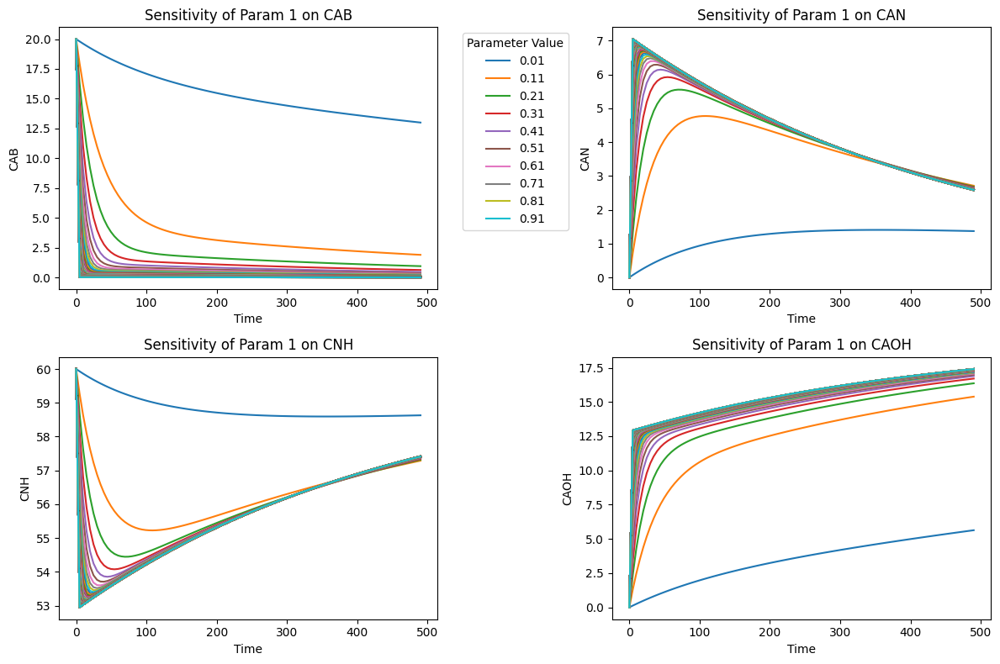

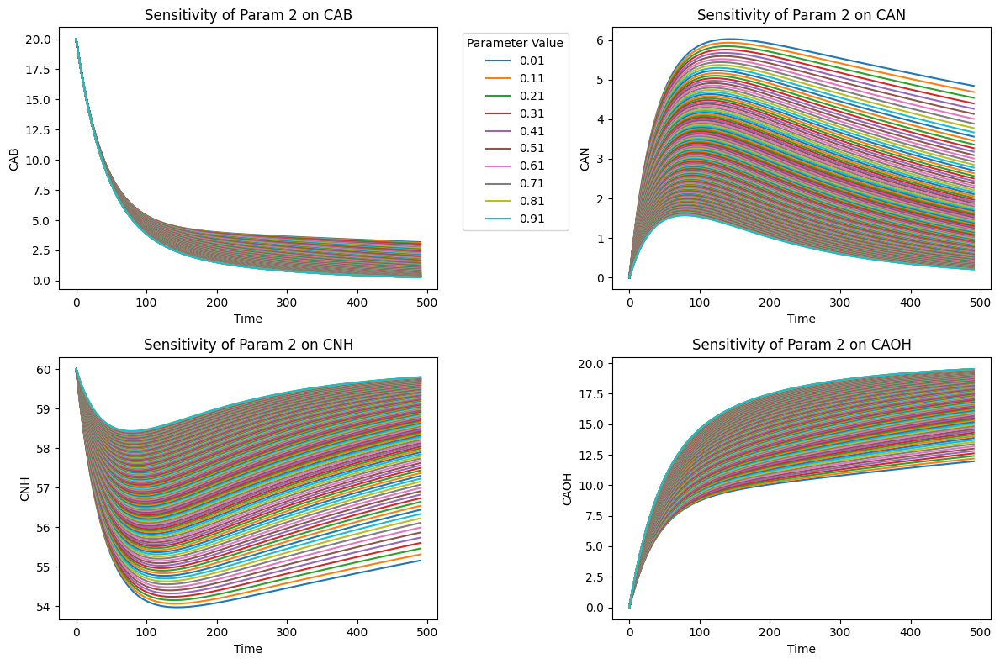

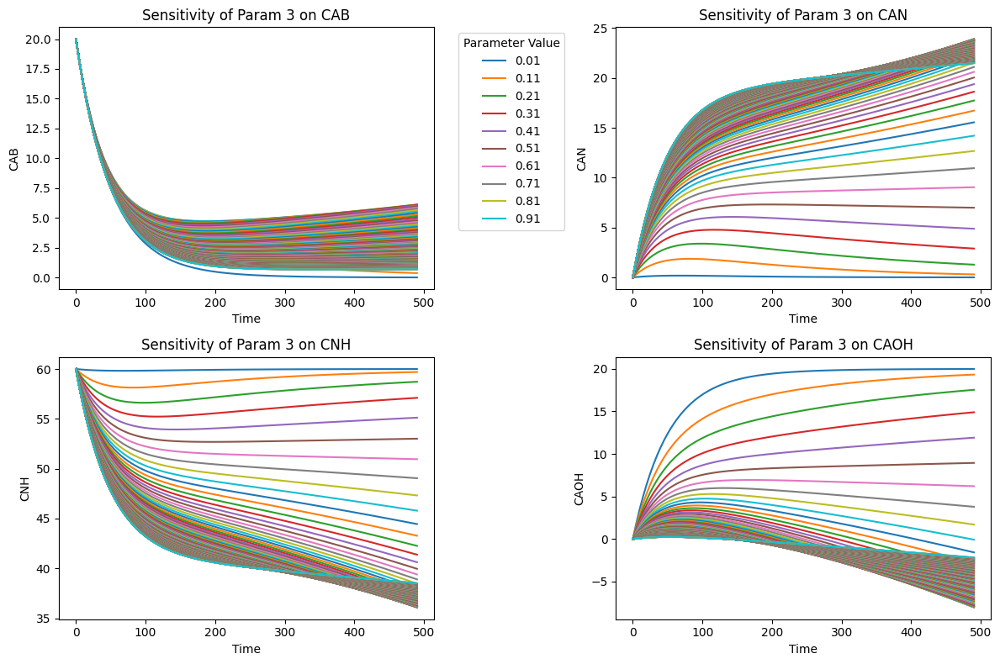

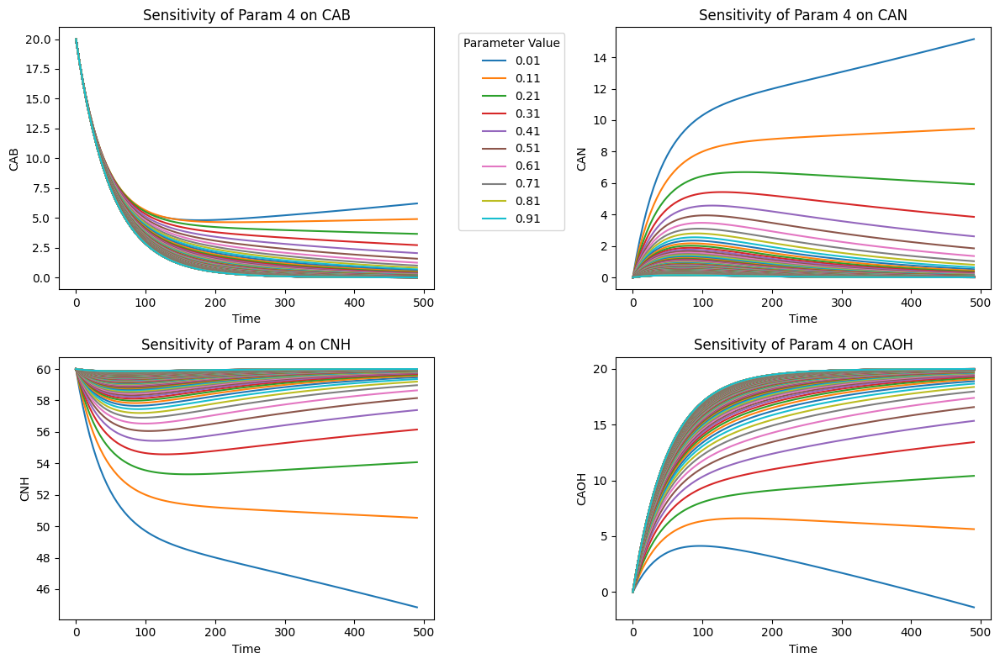

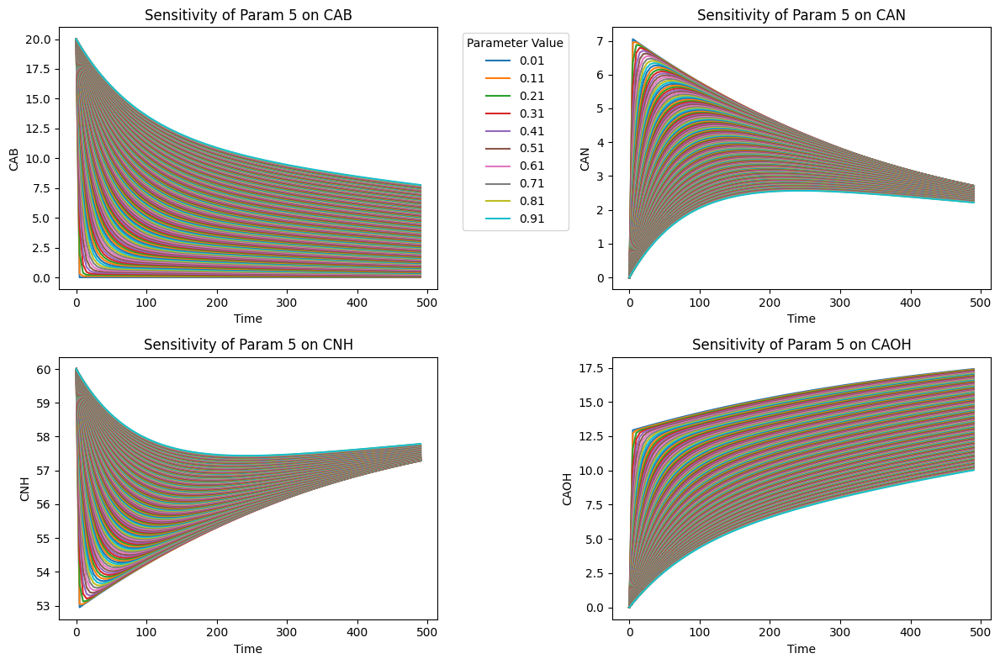

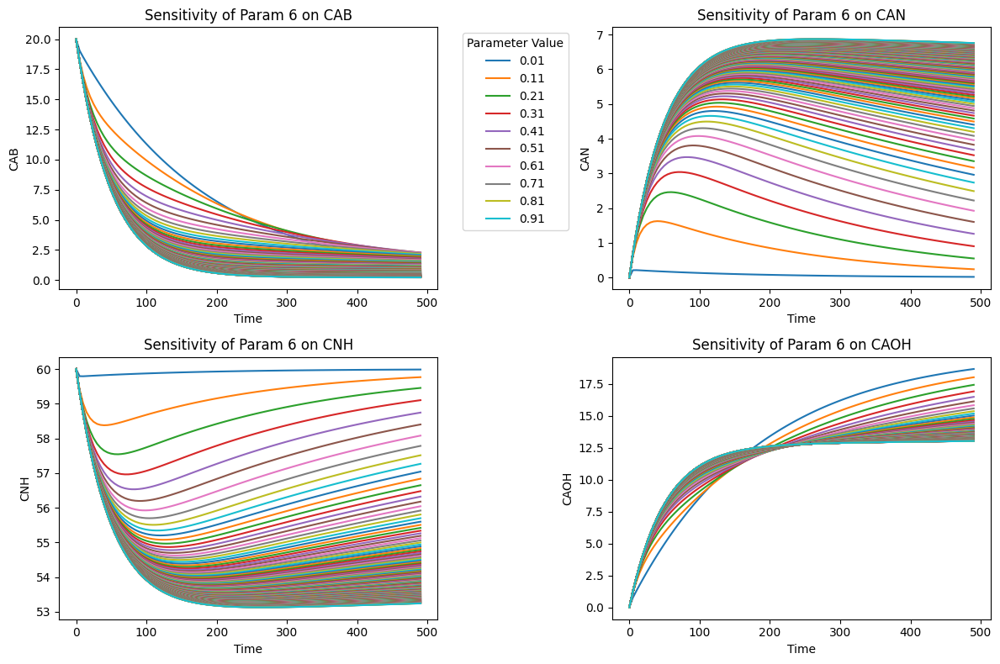

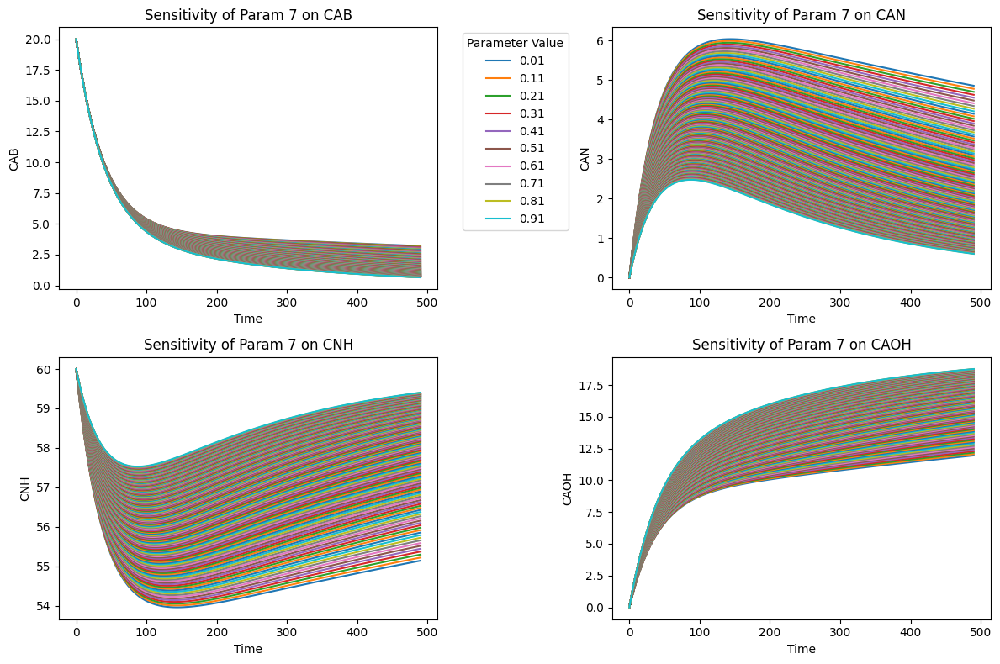

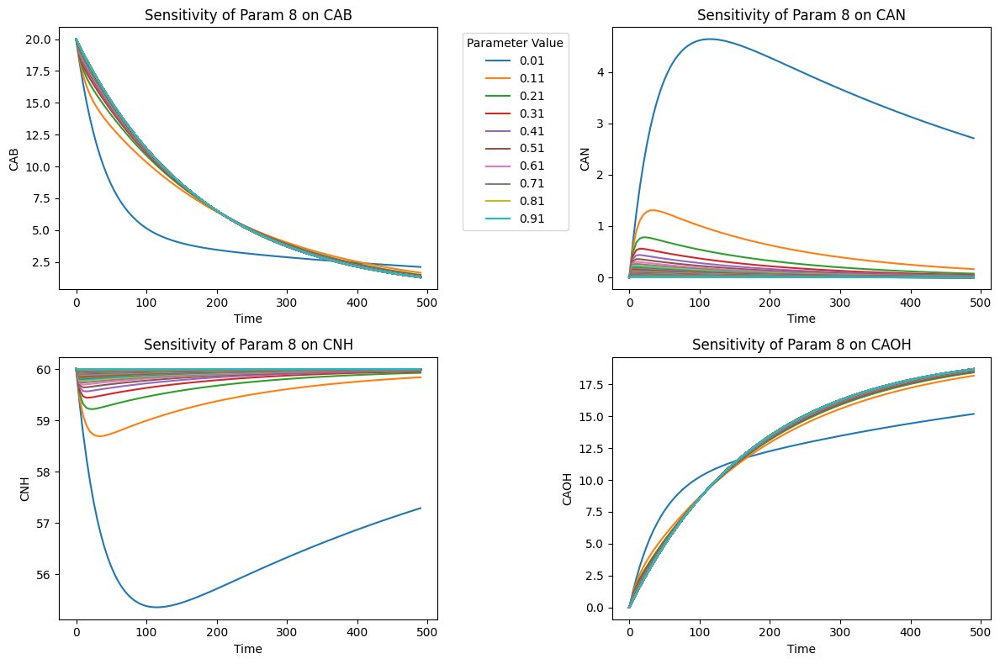

In [14]:
# Example usage of reduced density plot
for i in range(len(base_params)):
    plot_reduced_density(sensitivity_results, i, f'Param {i+1}', ['CAB', 'CAN', 'CNH', 'CAOH'])

### Visão com shading de distribuição

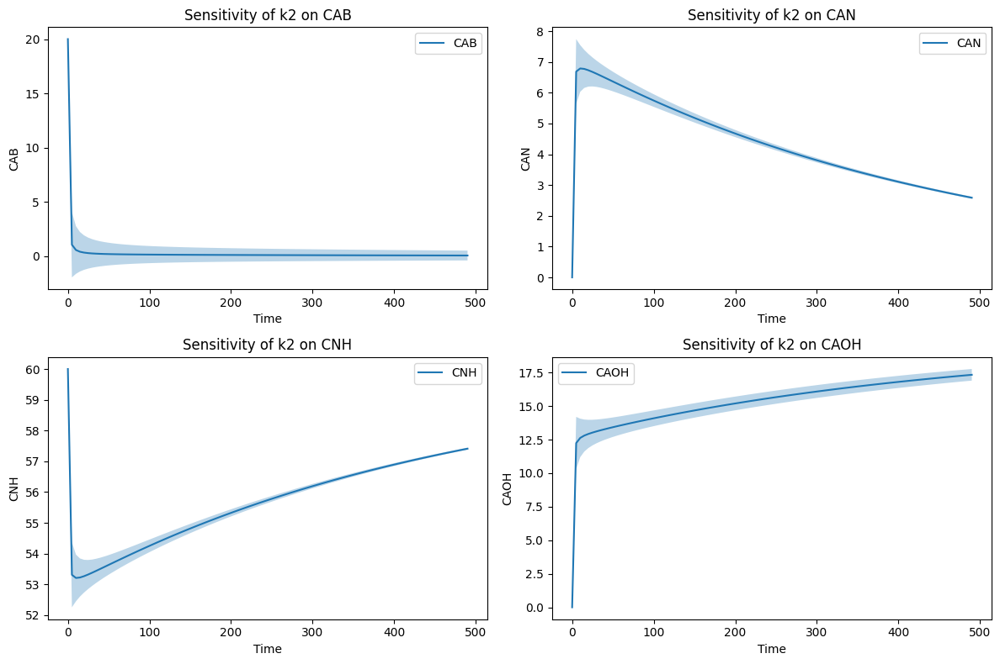

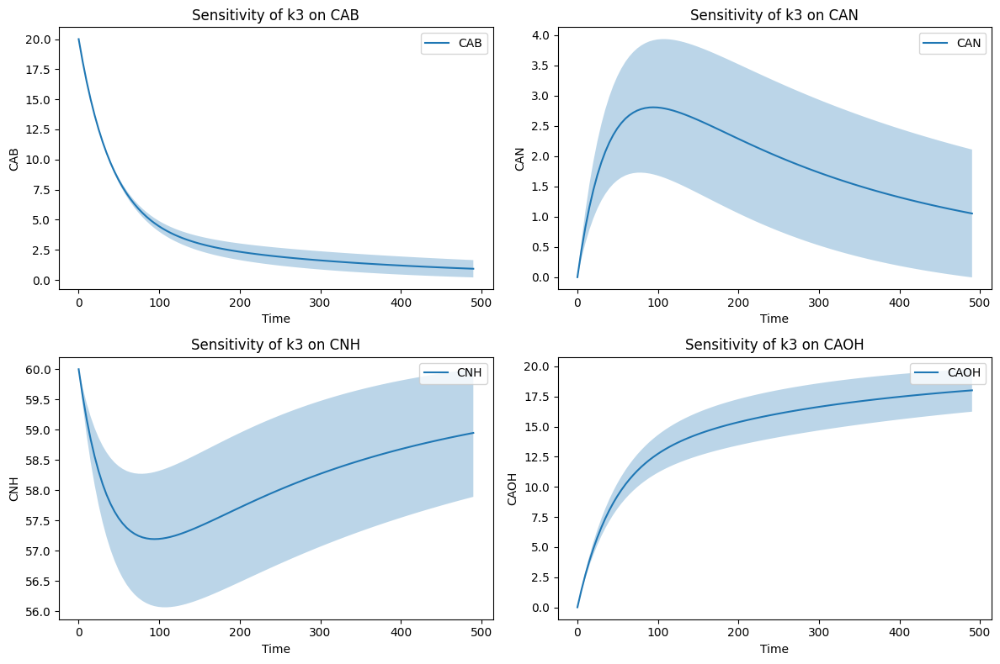

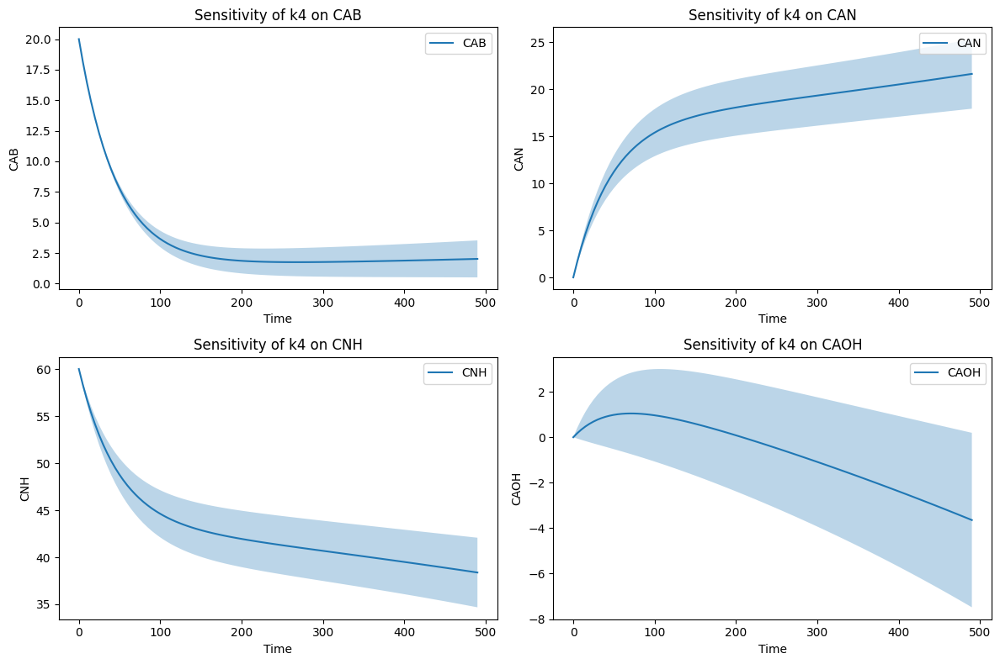

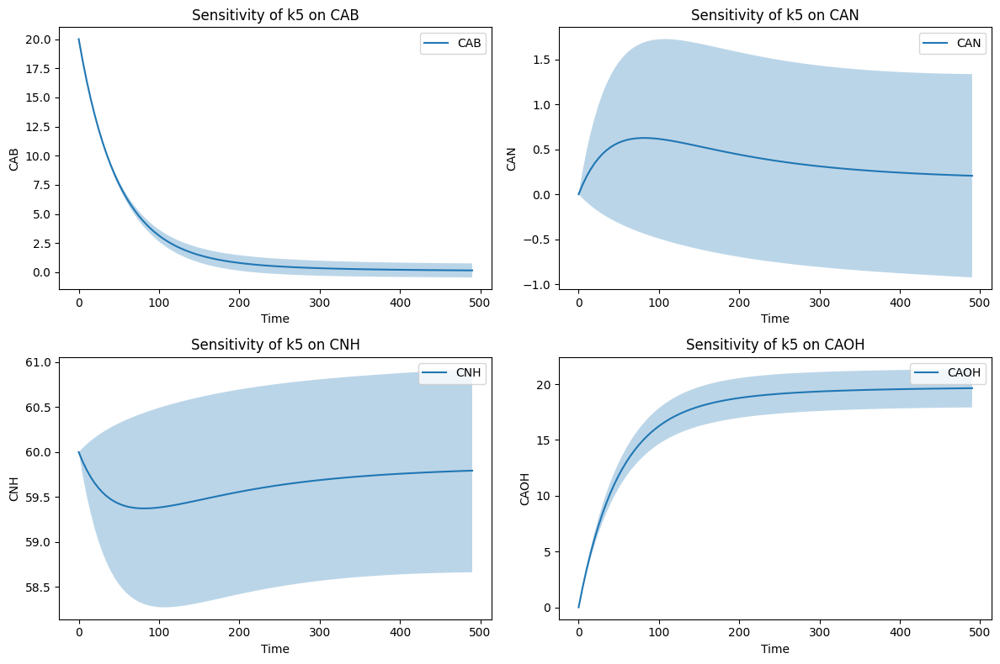

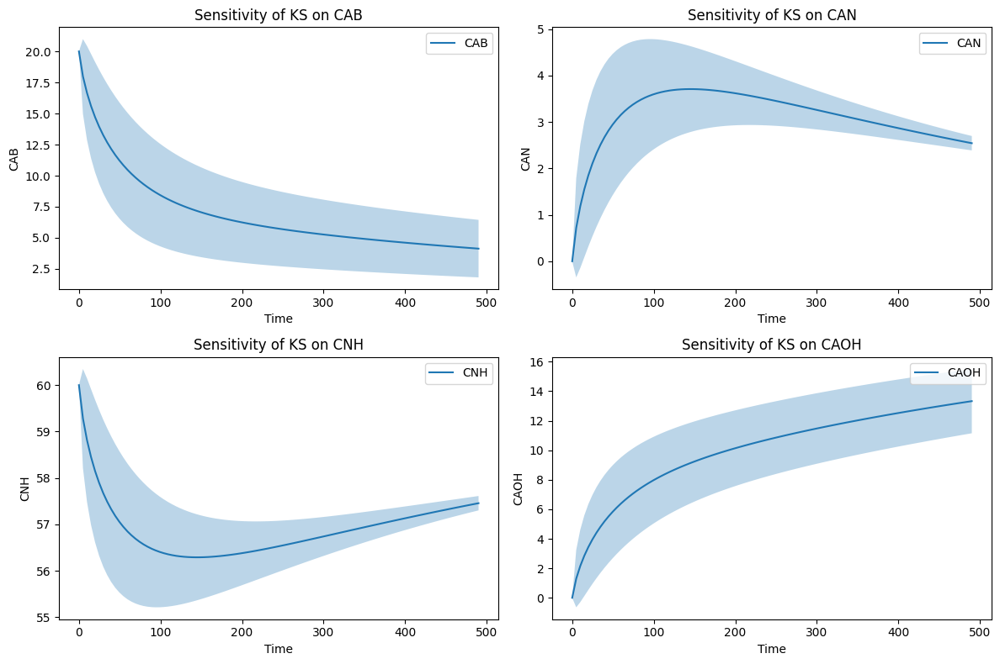

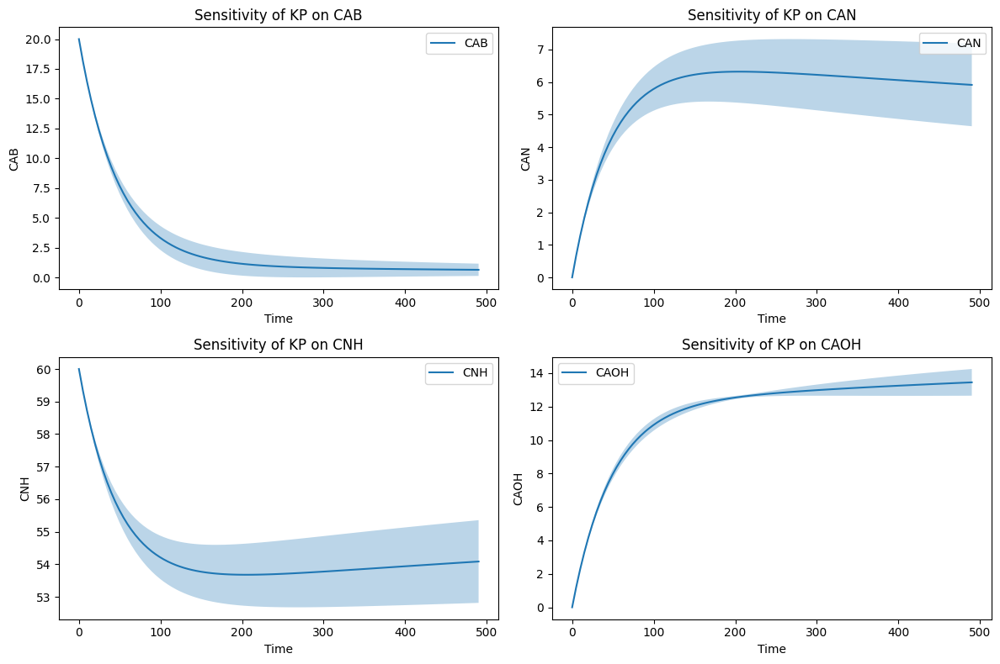

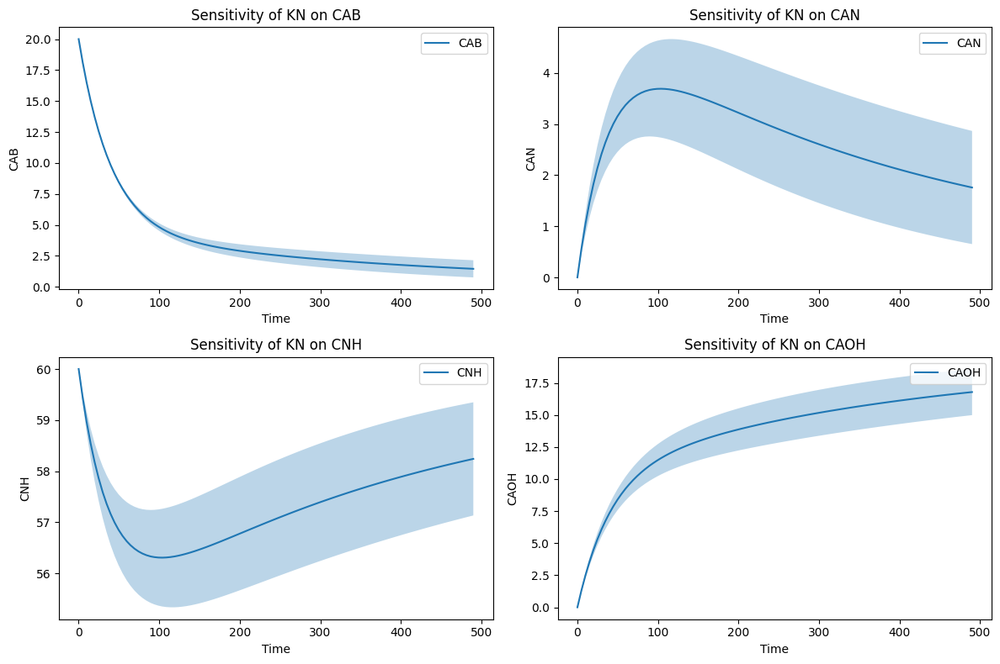

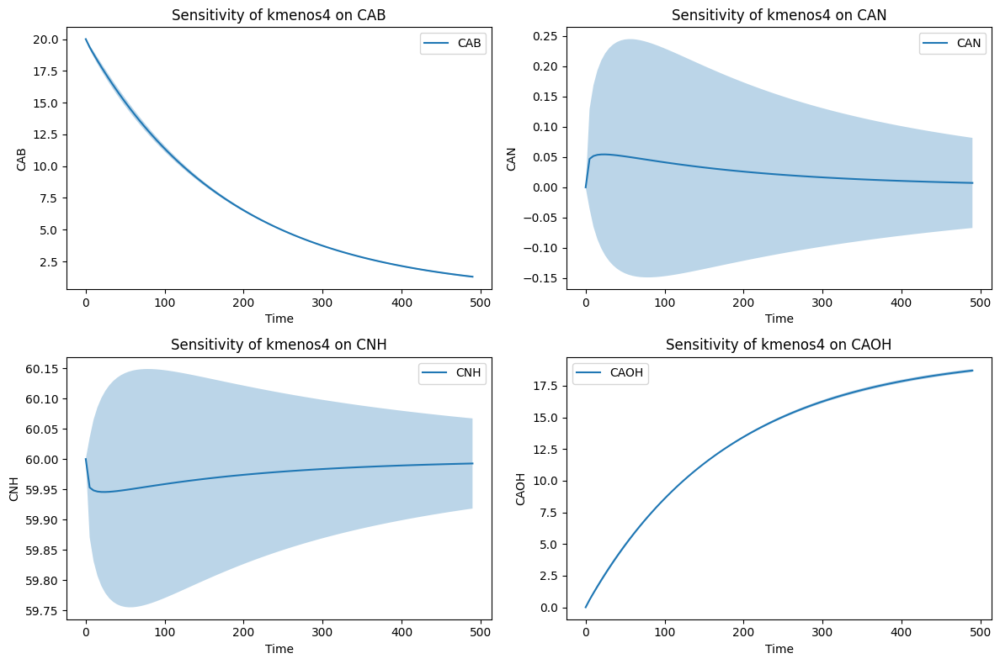

In [15]:
for i in range(len(base_params)):
    data = sensitivity_results[f'param_{i}']['outputs']
    plot_summary_statistics_with_shading(data, labels[i], ['CAB', 'CAN', 'CNH', 'CAOH'])

### Cálculo e visualização de PRCC

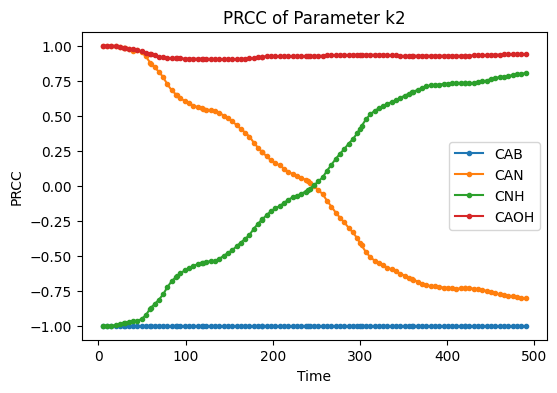

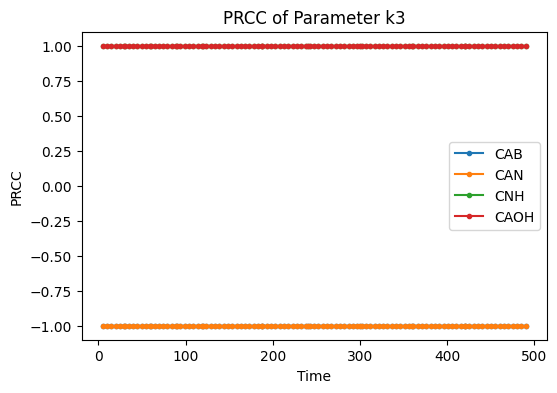

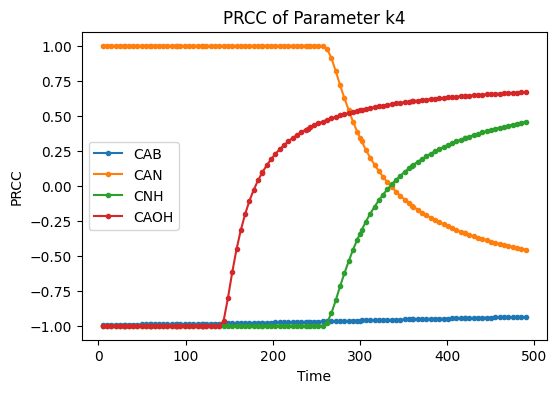

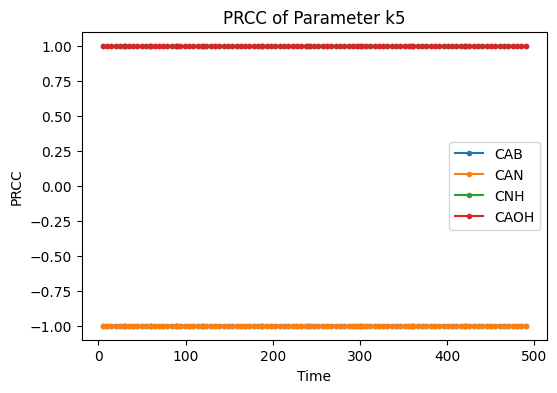

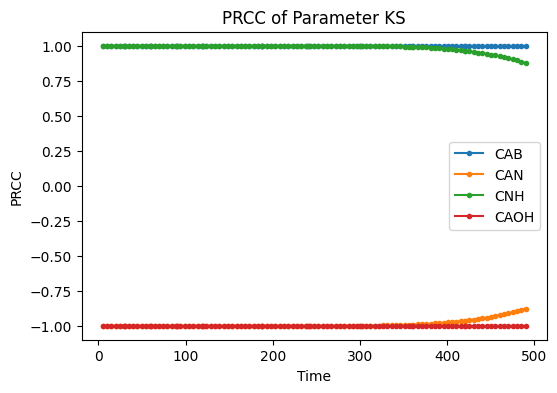

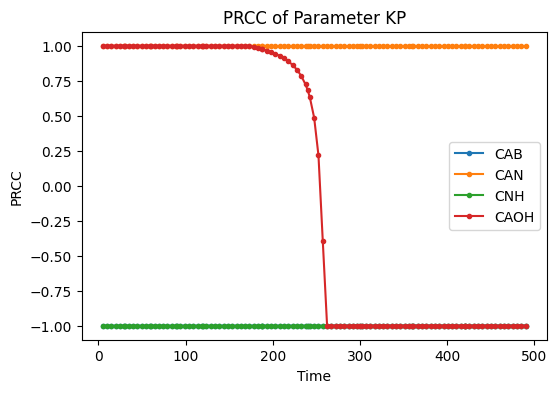

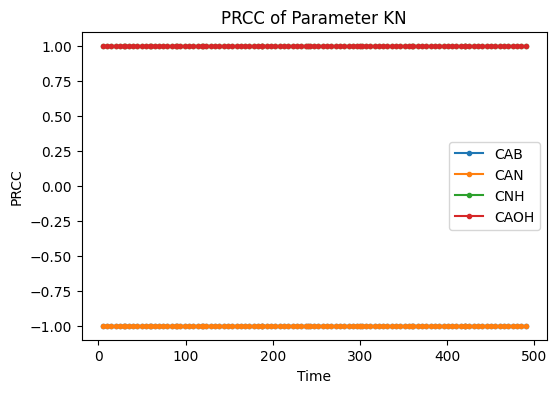

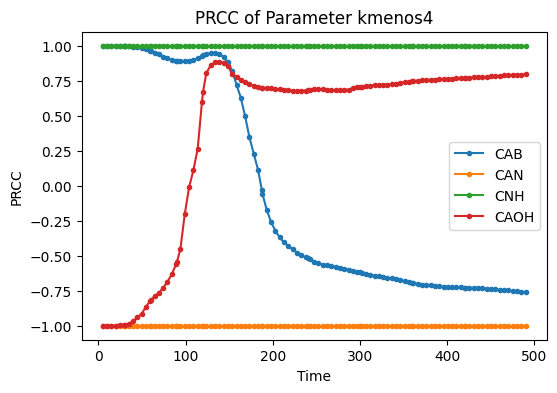

In [16]:
# Run PRCC analysis
prcc_values = prcc_analysis(sensitivity_results, t)

# Plot PRCC results
for i in range(len(base_params)):
    plt.figure(figsize=(6, 4))
    for j, label in enumerate(['CAB', 'CAN', 'CNH', 'CAOH']):
        plt.plot(t, prcc_values[f'param_{i}'][:, j],'.-', label=label)
    plt.xlabel('Time')
    plt.ylabel('PRCC')
    plt.title(f'PRCC of Parameter {labels[i]}')
    plt.legend()
    plt.show()

### Cálculo e visualização de SRC

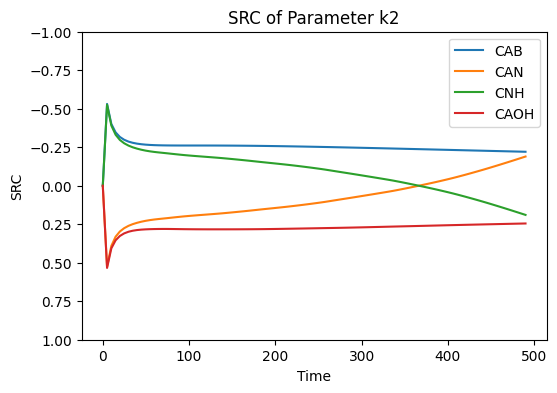

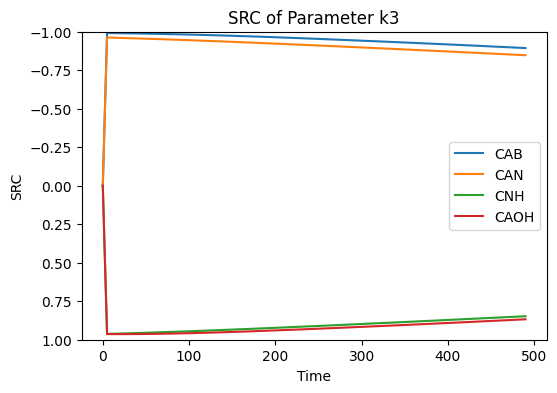

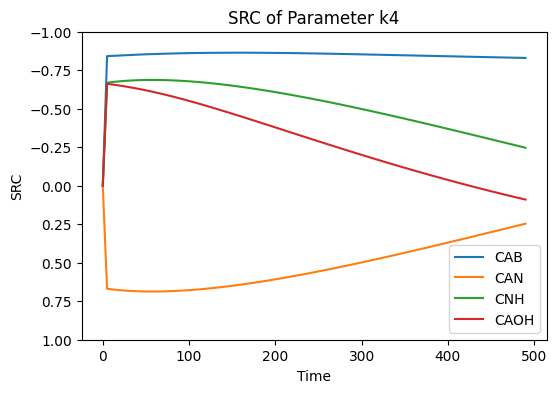

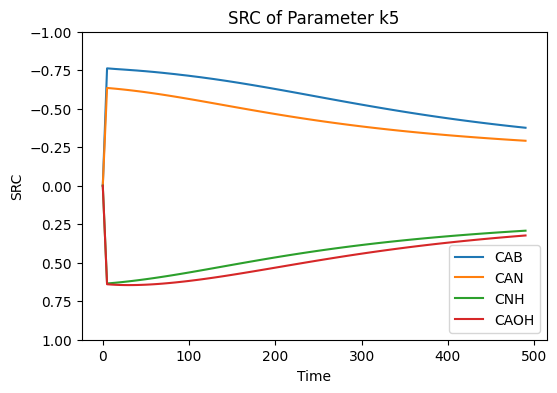

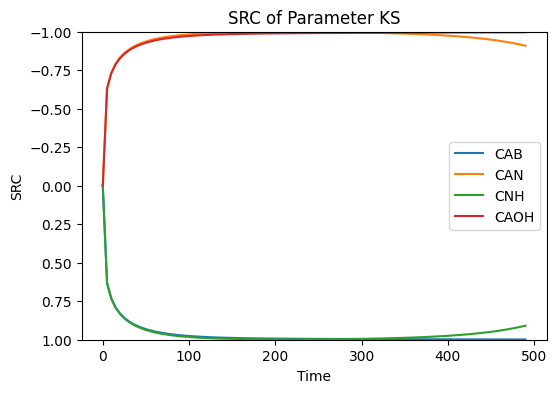

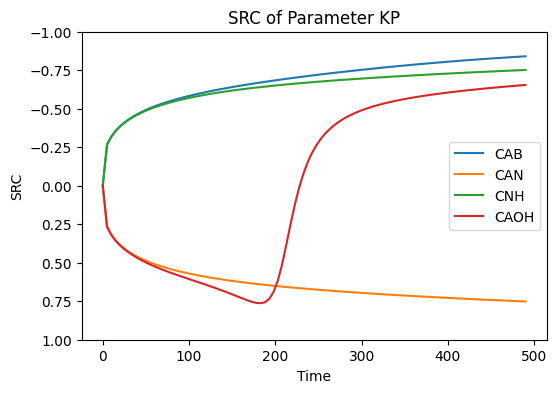

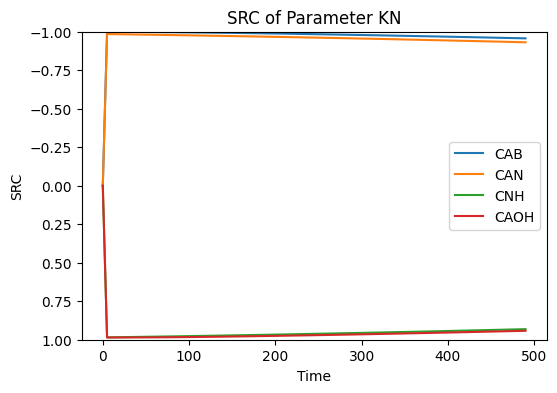

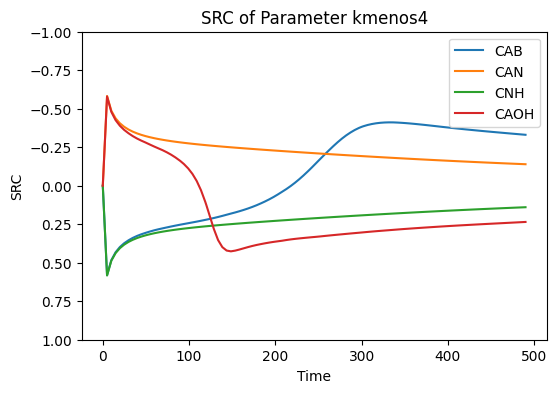

In [17]:

# Run SRC analysis
src_values = src_analysis(sensitivity_results, t)

# Plot SRC results
for i in range(len(base_params)):
    plt.figure(figsize=(6, 4))
    for j, label in enumerate(['CAB', 'CAN', 'CNH', 'CAOH']):
        plt.plot(t, src_values[f'param_{i}'][:, j], label=label)
    plt.ylim((1,-1))
    plt.xlabel('Time')
    plt.ylabel('SRC')
    plt.title(f'SRC of Parameter {labels[i]}')
    plt.legend()
    plt.show()

# Avaliação do Modelo antigo (modelo 1)

In [18]:
def enzymic_amox_model1(t,y, 
kcat1,
kcat2,
Km1,
Km2,  
Tmax, 
Ken,  
kAB,  
kAN,  
kAOH, 
kNH):
    FAB = 0
    FNH = 0 
    
    CAB = y[0]
    CAN = y[1]
    CNH = y[2]
    CAOH = y[3]
    Cez = 1

    # Consumo de ester
    VAB = (kcat1*CAB*Cez)/((Km1*(1 + (CAN/kAN) + (CAOH/kAOH))) + CAB)
    
    # Hidrolise de amoxicilina
    VAN = (kcat2*CAN*Cez)/((Km2*(1 + (CAB/kAB) + (CNH/kNH) + (CAOH/kAOH))) + CAN)
    
    # Enzima saturada com 6-apa
    X   = CNH/(Ken + CNH)
    
    # Sintese enzimatica
    VS  = VAB*Tmax*X

    # Hidrolise de ester
    Vh1 = (VAB - VS) 

    dy = np.zeros(4)

    # C. ester
    dy[0] = ((-(VS - VAN) - (Vh1 + VAN)) + FAB) 
    
    # C. amox
    dy[1] = (VS - VAN)                         
    
    # C. 6-apa
    dy[2] = (-(VS - VAN) + FNH)                
    
    # C. POHPG
    dy[3] =  (Vh1 + VAN)
    
    return np.array(dy)                                           

In [19]:
def ode15s_amox(P, CI, t):
    return scipy.integrate.solve_ivp(enzymic_amox_model1,t_span=(t[0],t[-1]),t_eval=t,y0=CI,method='BDF',args=P).y

## Condições iniciais e parâmetros fixos

In [20]:
# Define the initial conditions and time points
y0 = CI

kcat1        = 0.181
kcat2        = 0.395
Km1          = 5.449
Km2          = 1.694
Tmax         = 0.824
Ken          = 7.947
kAB          = 0.682
kAN          = 1.989
kAOH         = 9.856
kNH          = 9.763

P = np.zeros(10)
P[0]   = kcat1    
P[1]   = kcat2    
P[2]   = Km1      
P[3]   = Km2      
P[4]   = Tmax     
P[5]   = Ken      
P[6]   = kAB      
P[7]   = kAN      
P[8]   = kAOH     
P[9]  = kNH 
base_params = P

labels = ['kcat1',
'kcat2',
'Km1',
'Km2',  
'Tmax', 
'Ken',  
'kAB',  
'kAN',  
'kAOH', 
'kNH']

# Define the ranges for each parameter
param_ranges = [
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
    (0.01, 20),
    
]

## Calculando sensitividade

In [21]:
# Run sensitivity analysis
sensitivity_results = sensitivity_analysis(base_params, param_ranges, y0, t,ode15s_amox)

evaluating kcat1
evaluating kcat2
evaluating Km1
evaluating Km2
evaluating Tmax
evaluating Ken
evaluating kAB
evaluating kAN
evaluating kAOH
evaluating kNH


# Visualização da sensitividade modelo 1

## Visão geral

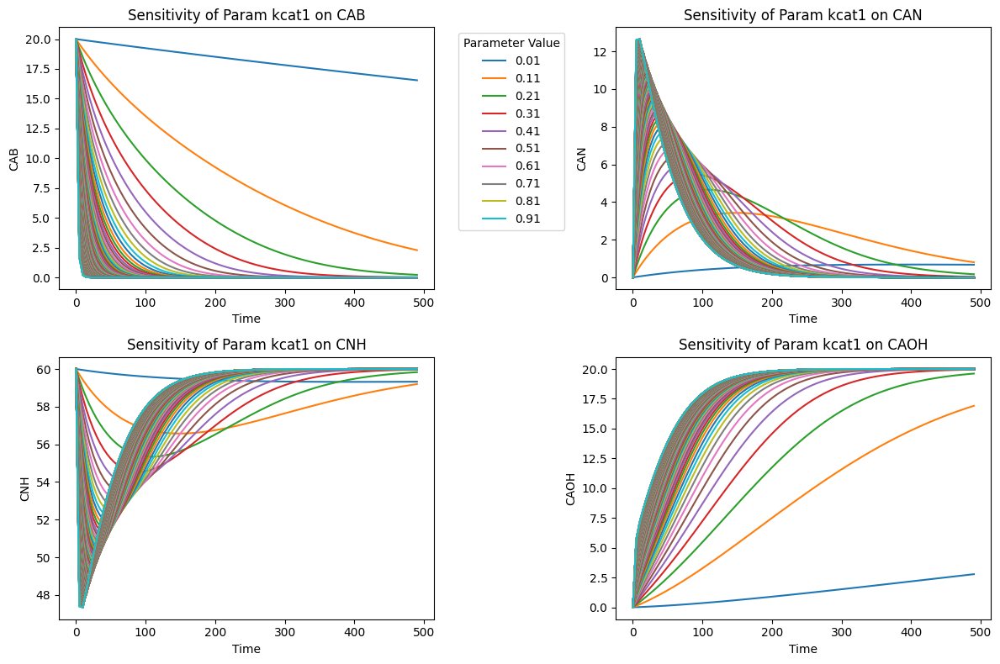

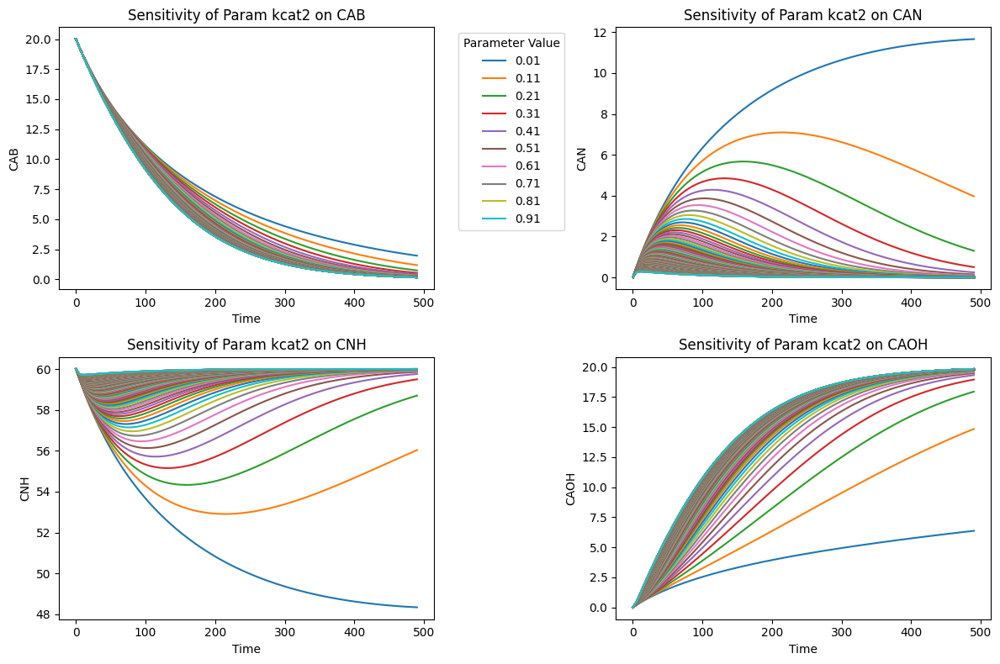

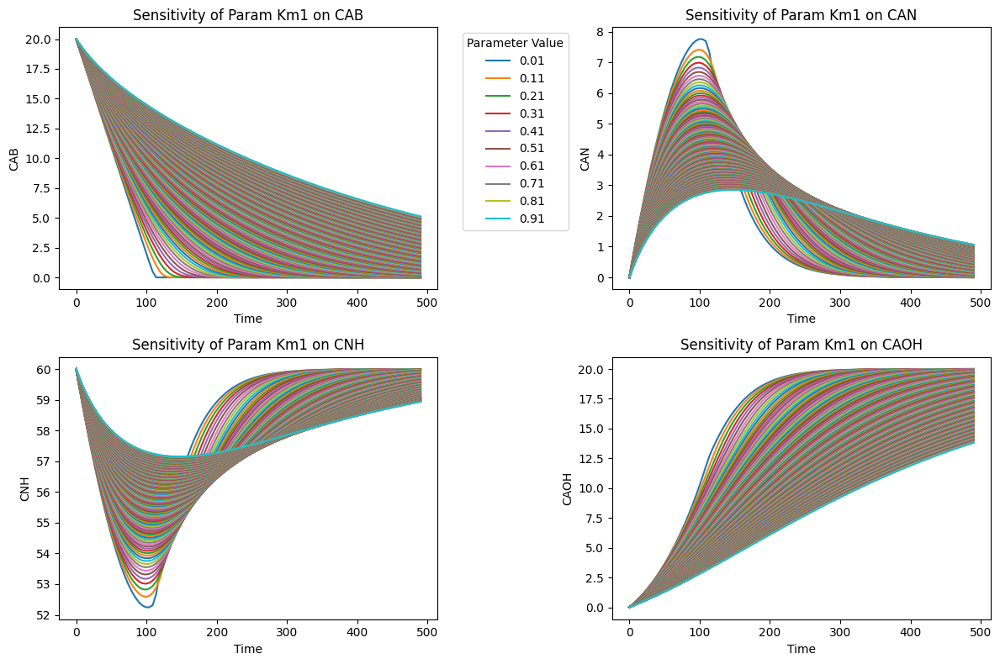

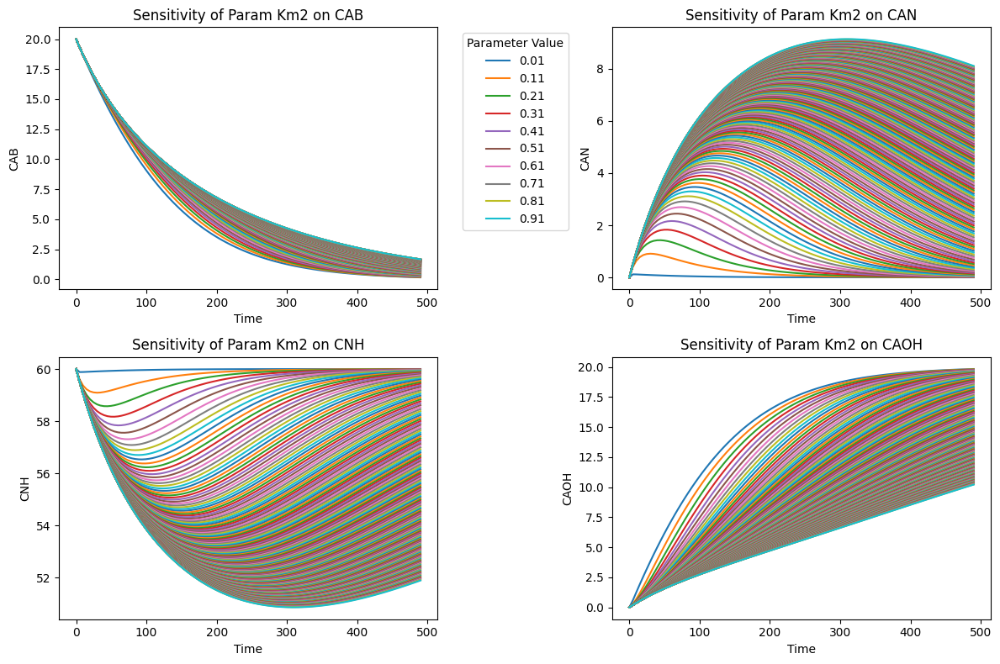

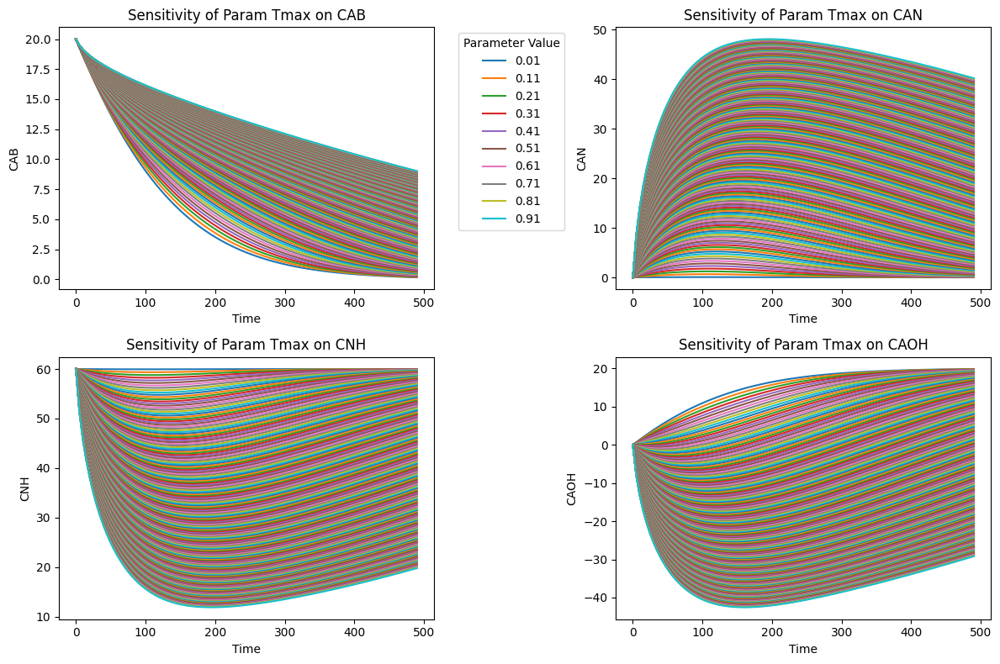

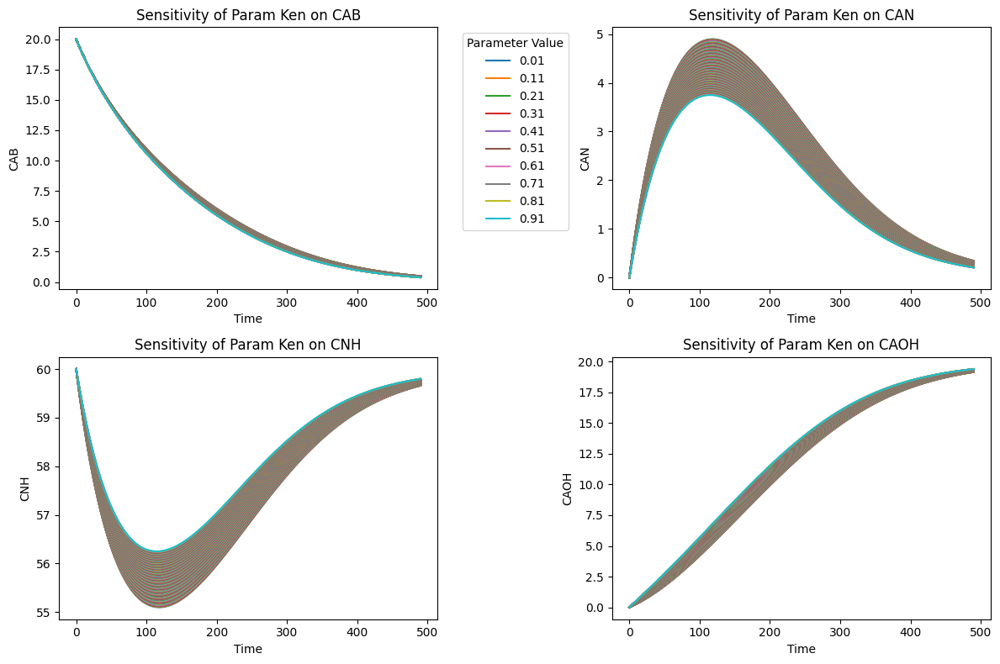

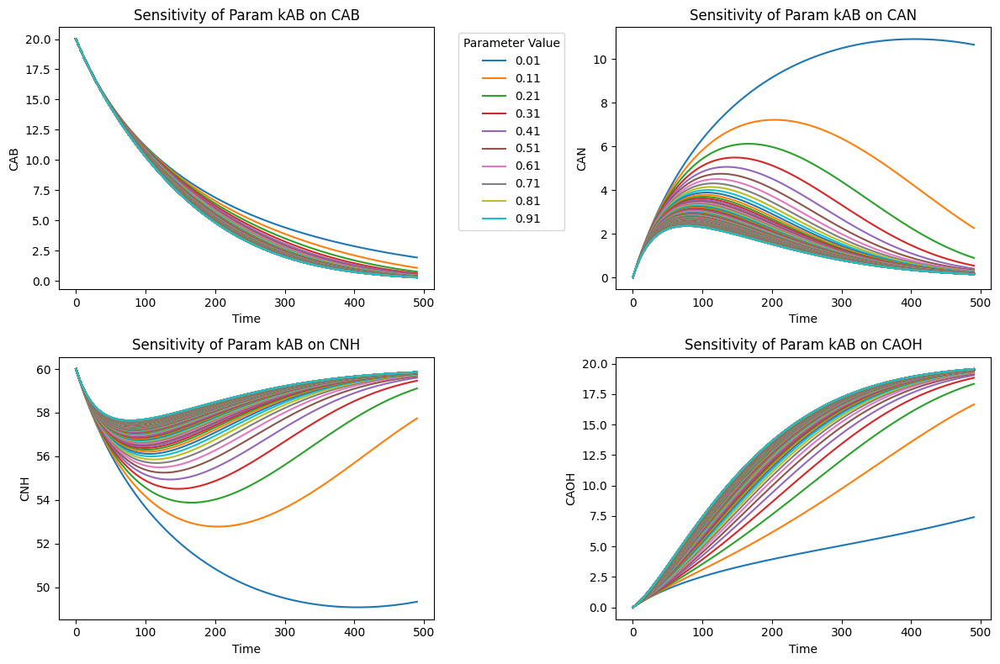

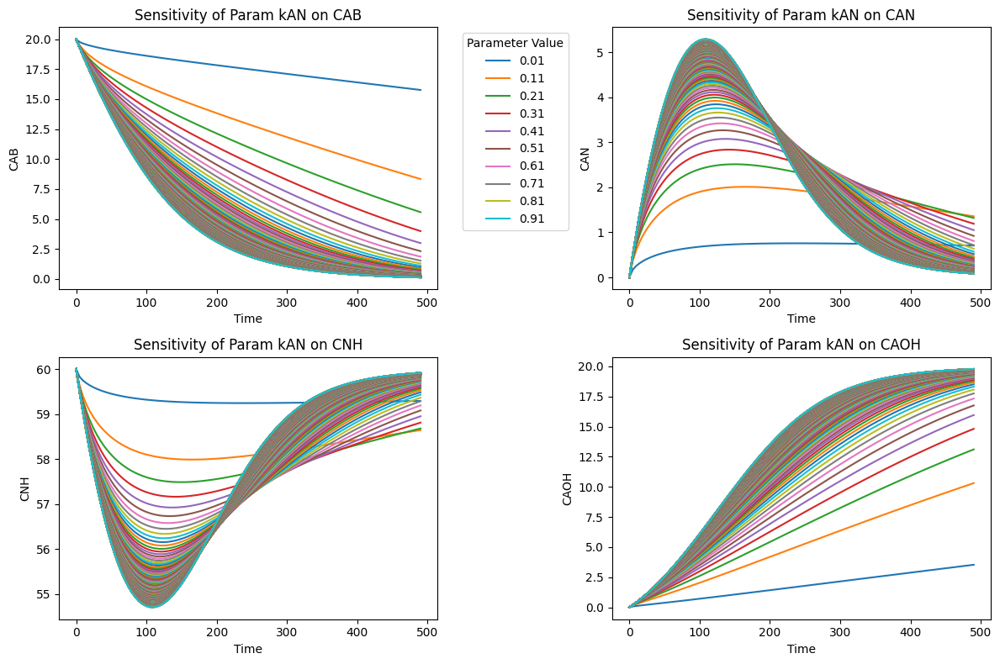

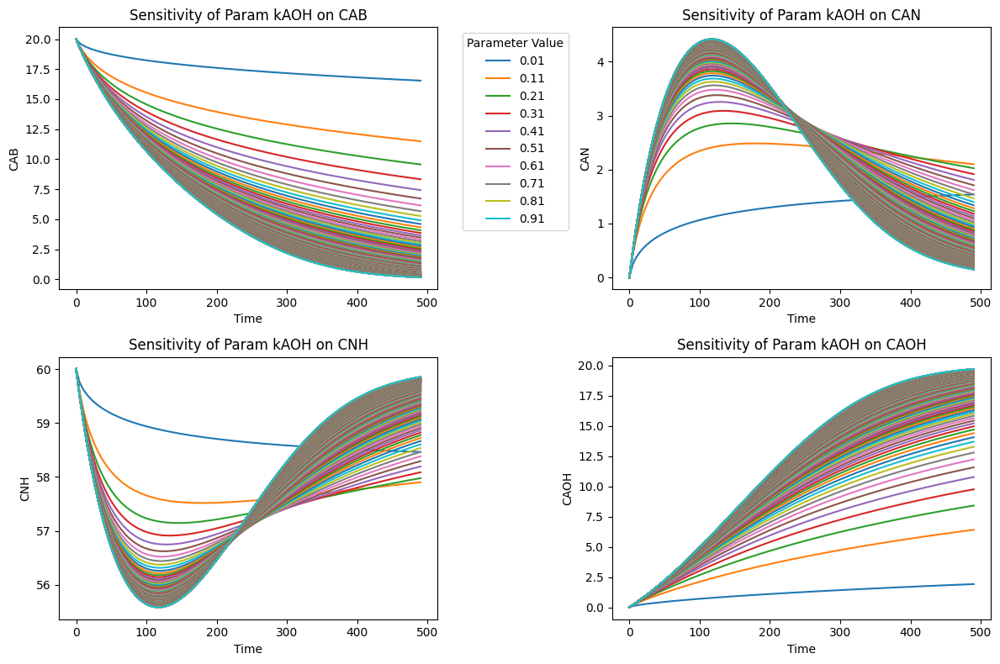

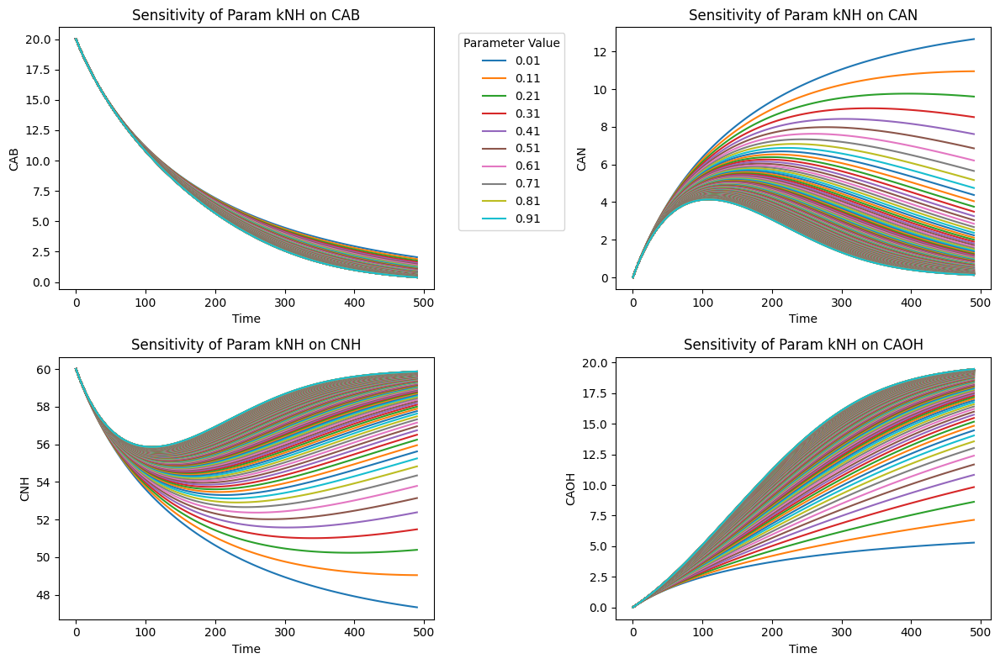

In [22]:
# Example usage of reduced density plot
for i in range(len(base_params)):
    plot_reduced_density(sensitivity_results, i, f'Param {labels[i]}', ['CAB', 'CAN', 'CNH', 'CAOH'])

# Visão geral com shading de distribuição

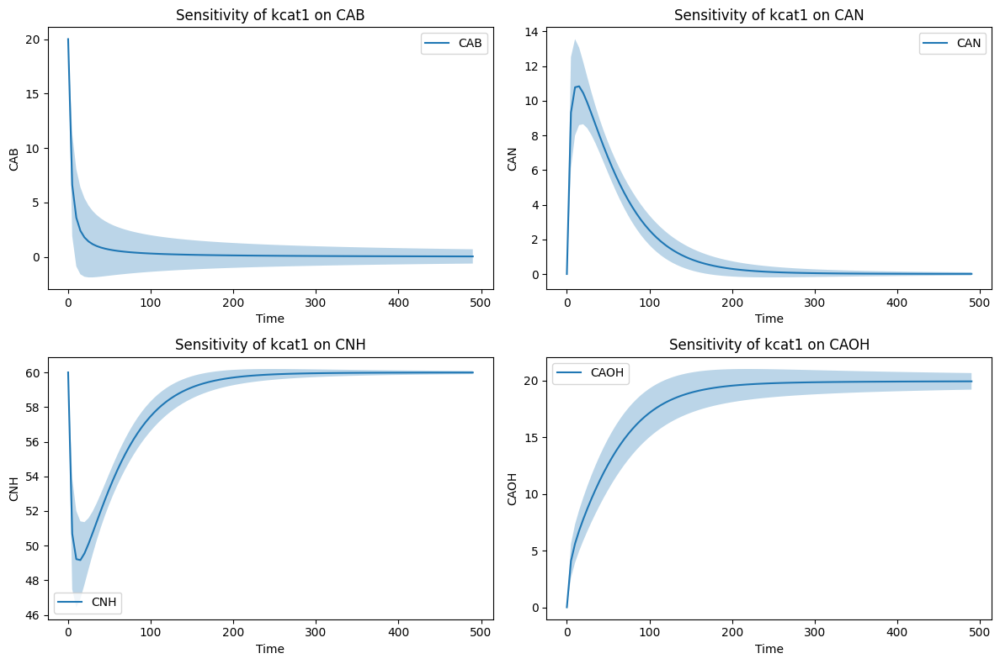

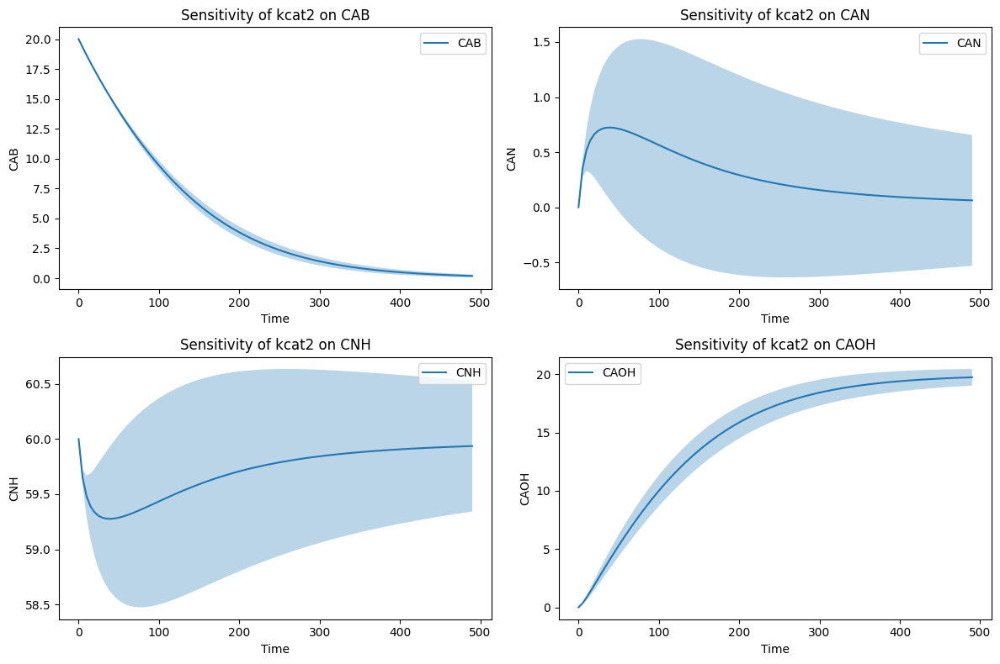

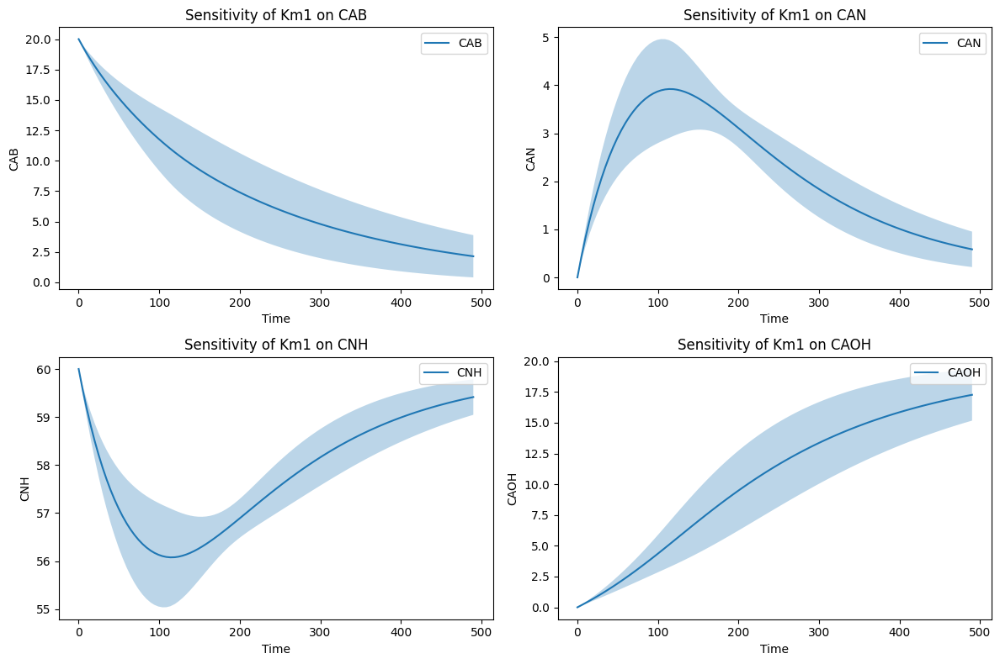

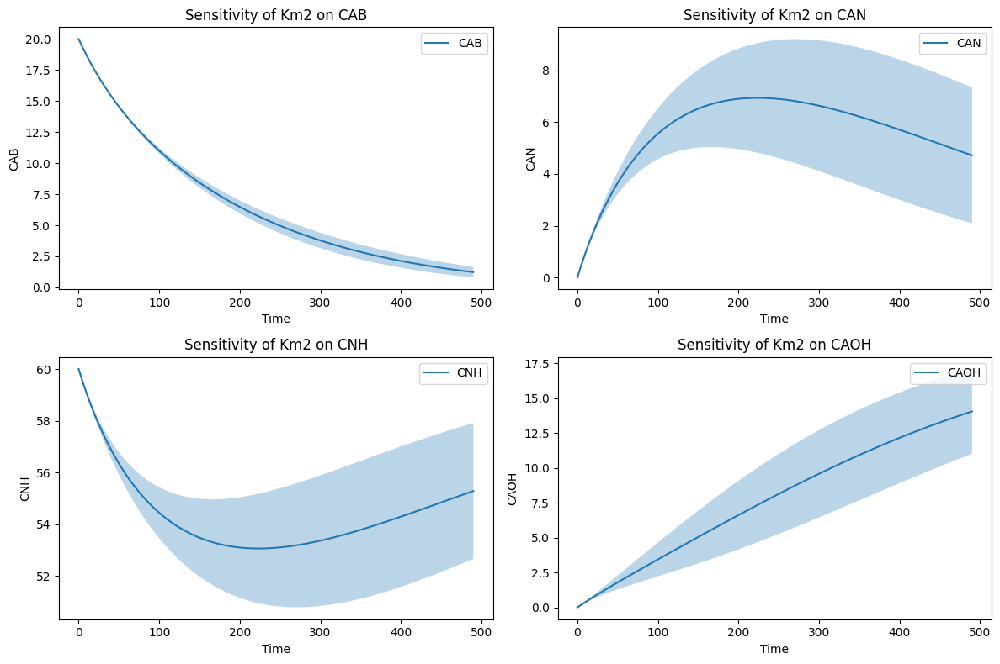

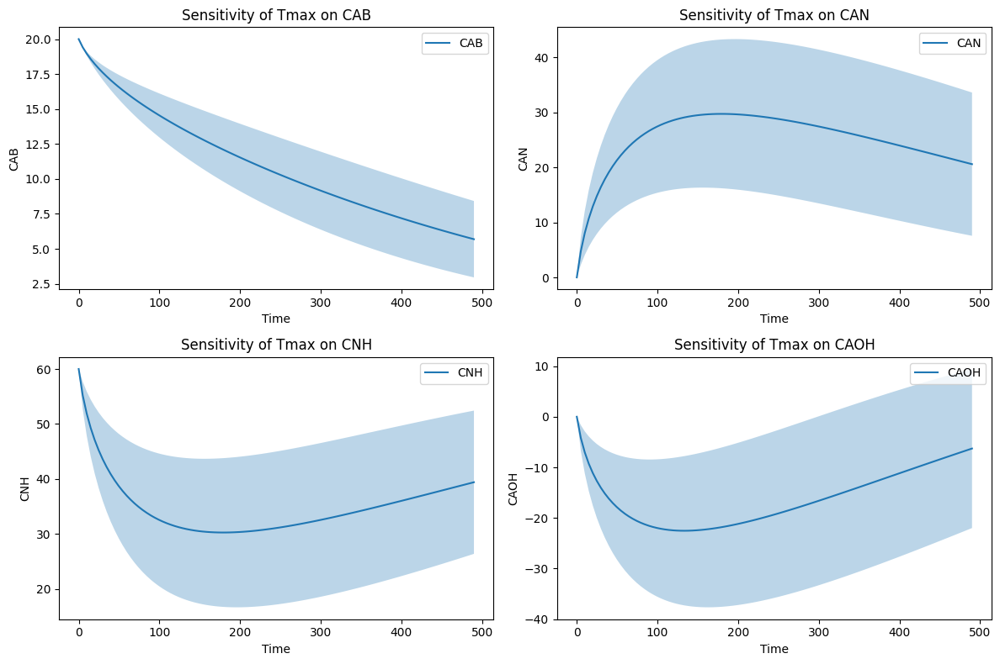

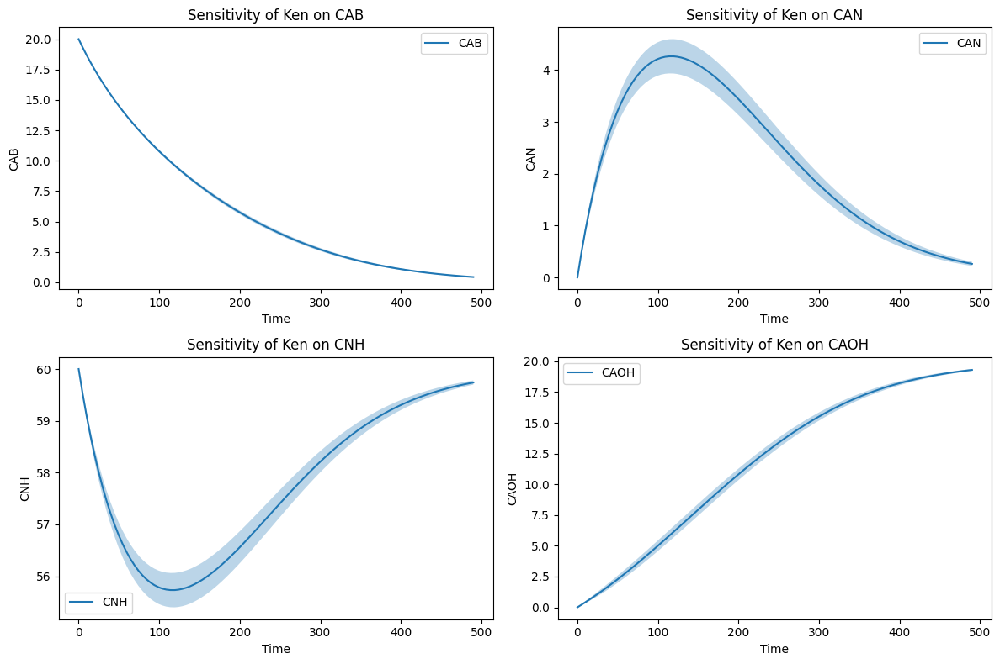

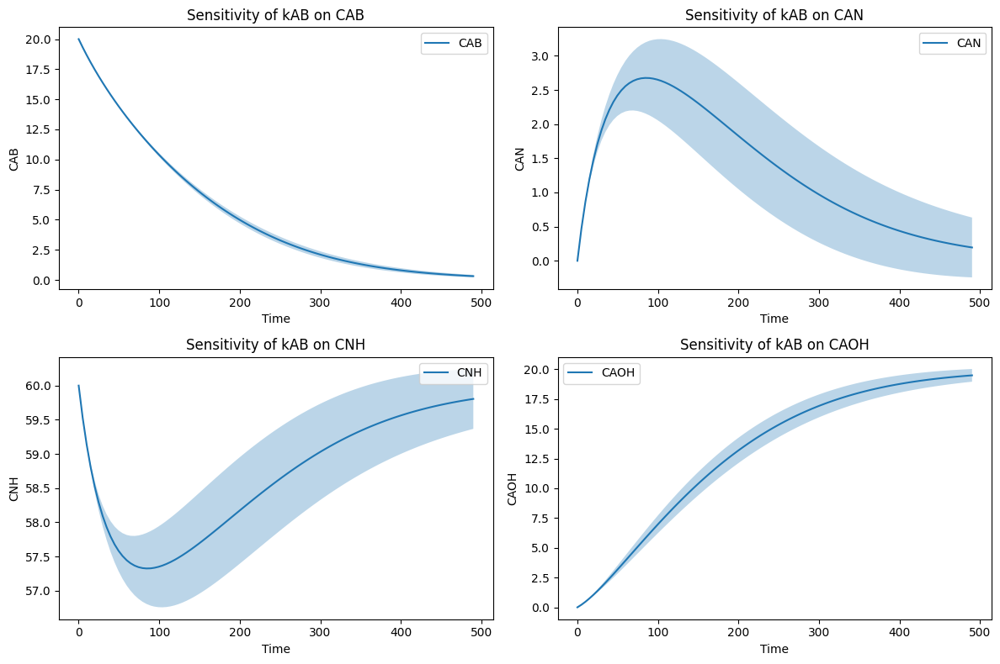

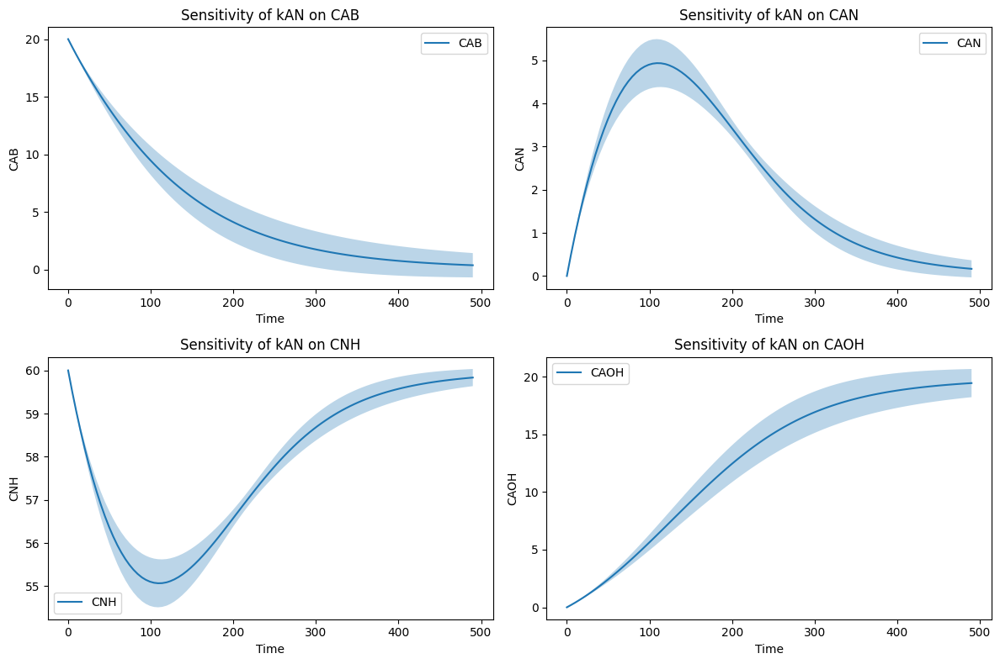

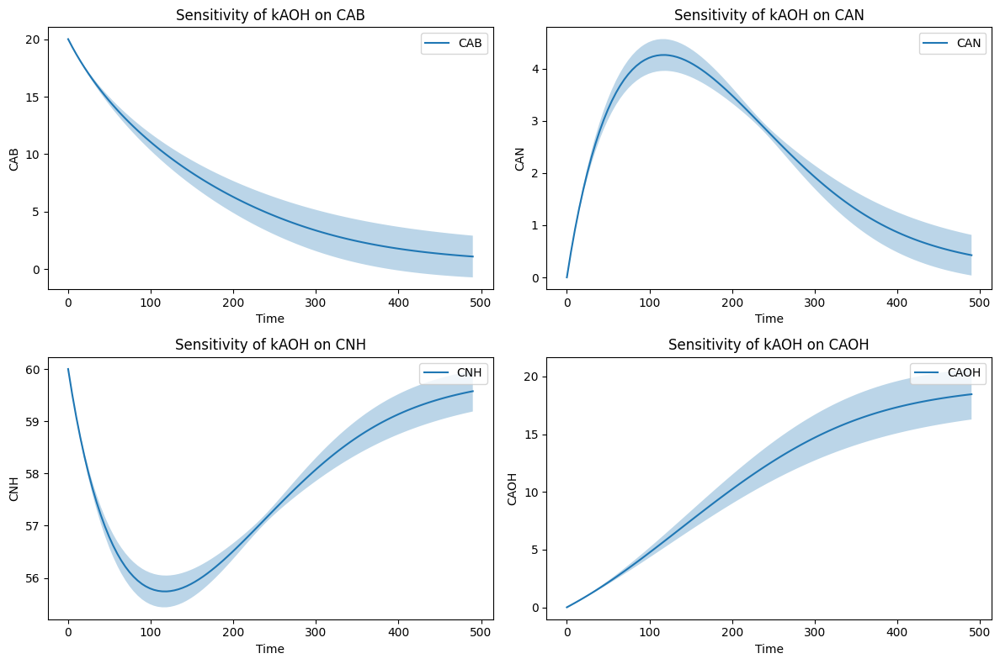

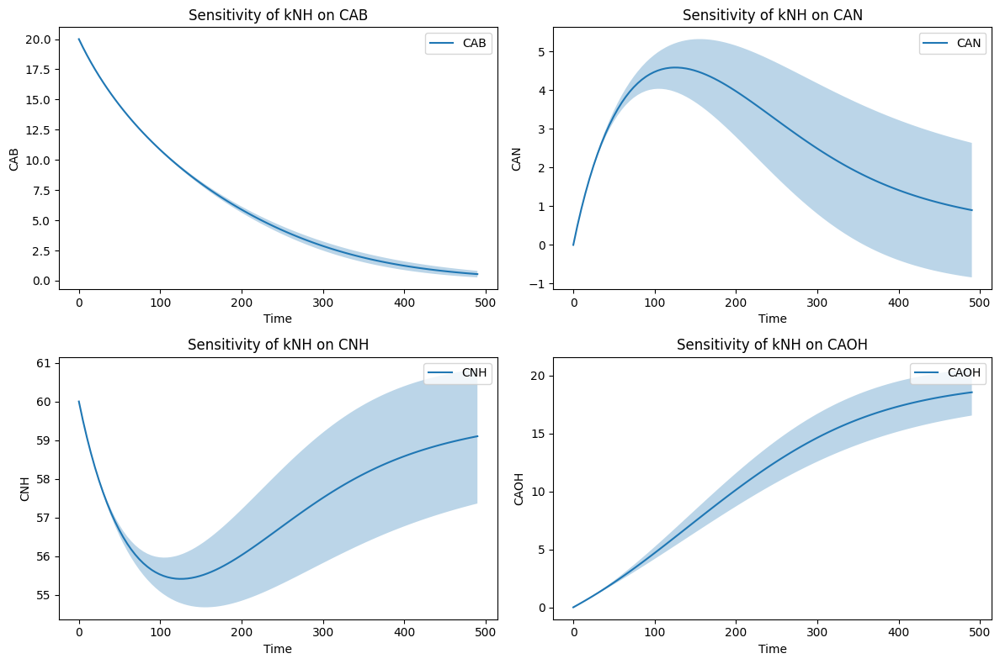

In [23]:
for i in range(len(base_params)):
    data = sensitivity_results[f'param_{i}']['outputs']
    plot_summary_statistics_with_shading(data, labels[i], ['CAB', 'CAN', 'CNH', 'CAOH'])

## Cálculo e visualização de PRCC

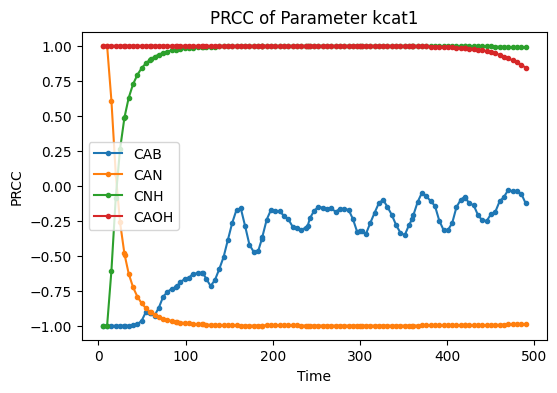

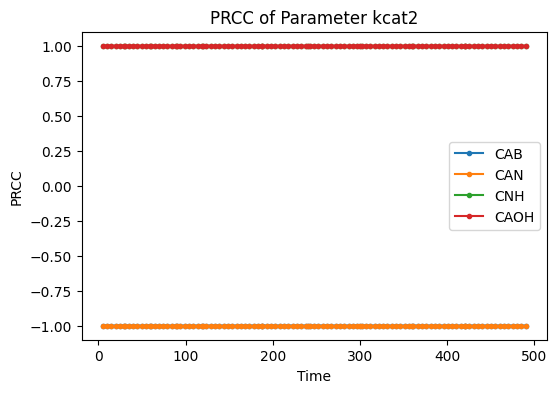

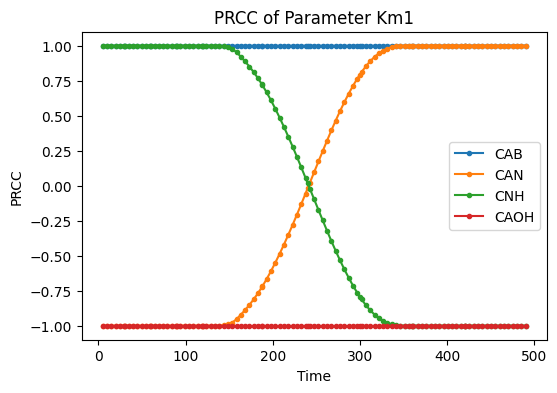

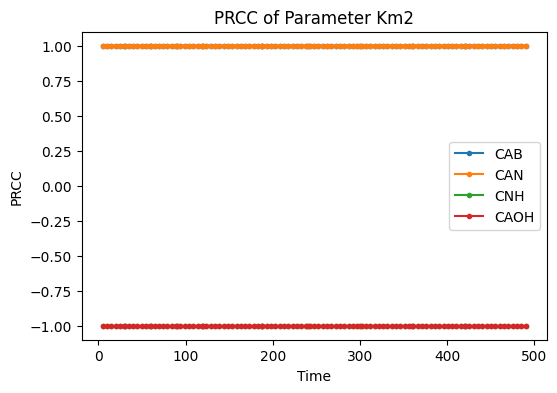

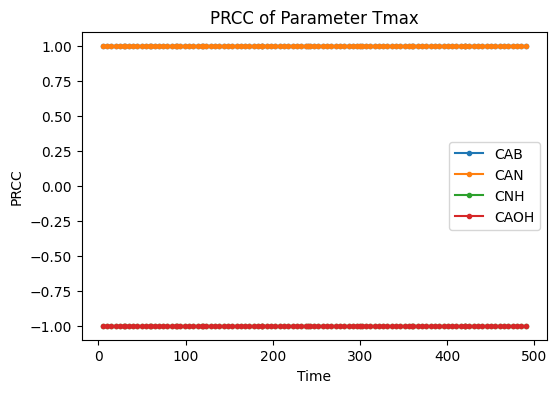

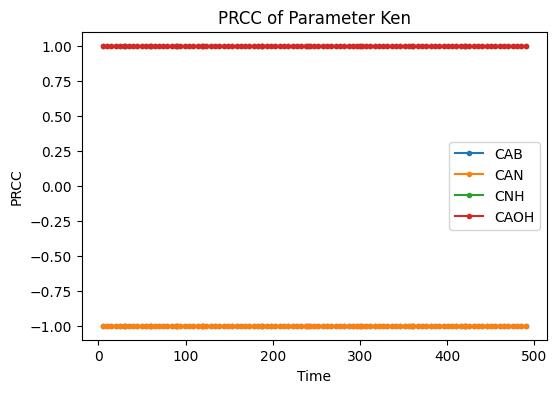

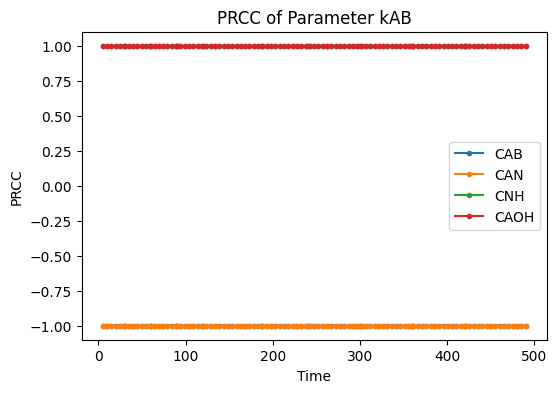

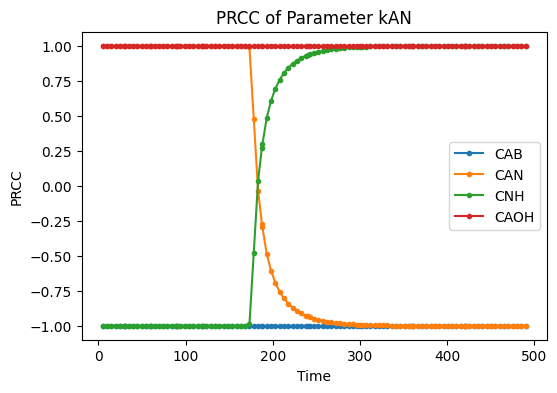

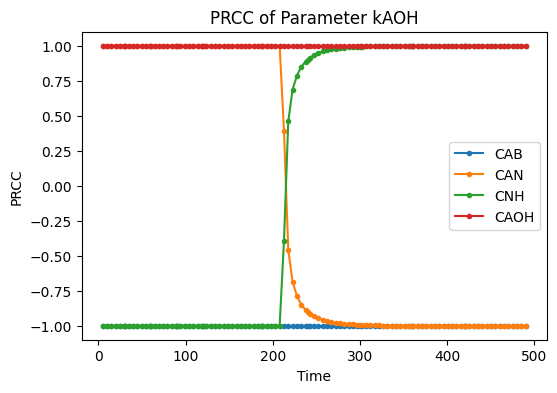

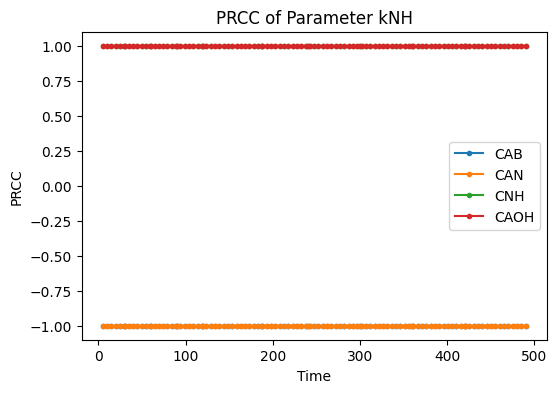

In [24]:
# Run PRCC analysis
prcc_values = prcc_analysis(sensitivity_results, t)

# Plot PRCC results
for i in range(len(base_params)):
    plt.figure(figsize=(6, 4))
    for j, label in enumerate(['CAB', 'CAN', 'CNH', 'CAOH']):
        plt.plot(t, prcc_values[f'param_{i}'][:, j],'.-', label=label)
    plt.xlabel('Time')
    plt.ylabel('PRCC')
    plt.title(f'PRCC of Parameter {labels[i]}')
    plt.legend()
    plt.show()

## Cálculo e visualização de SRC

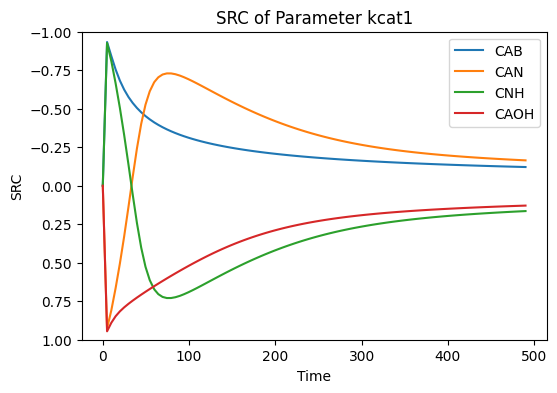

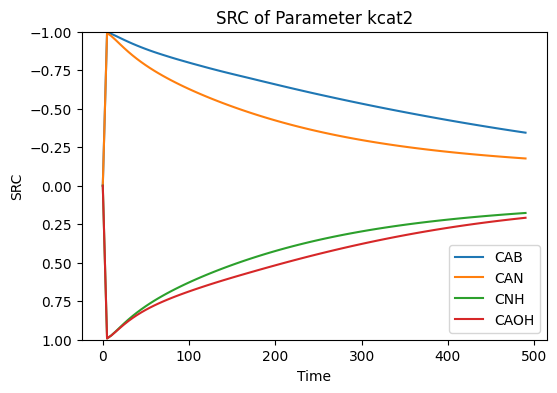

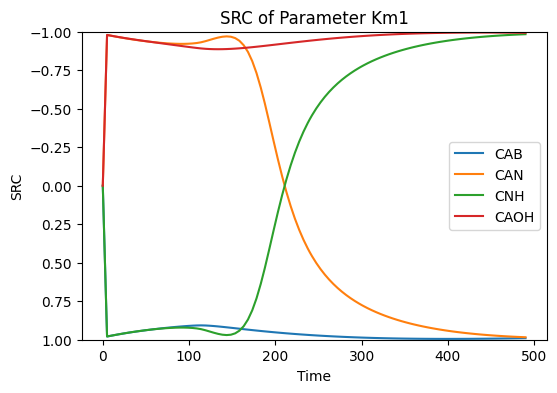

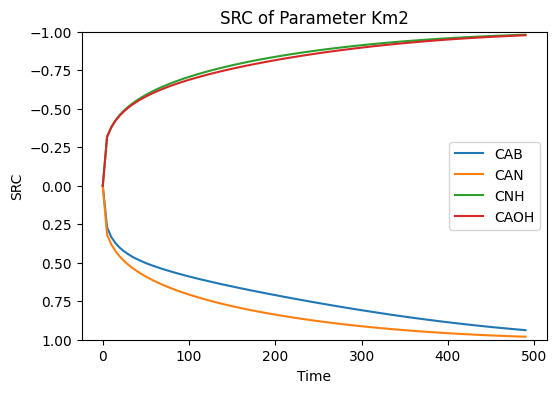

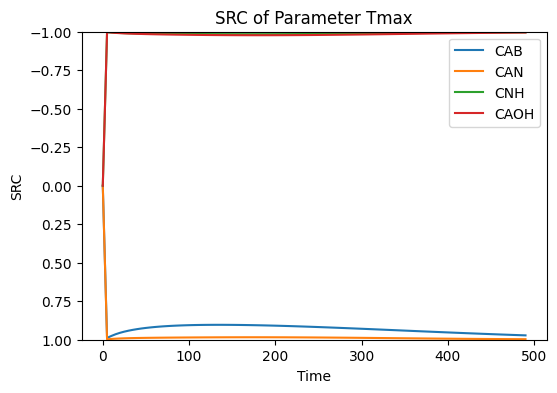

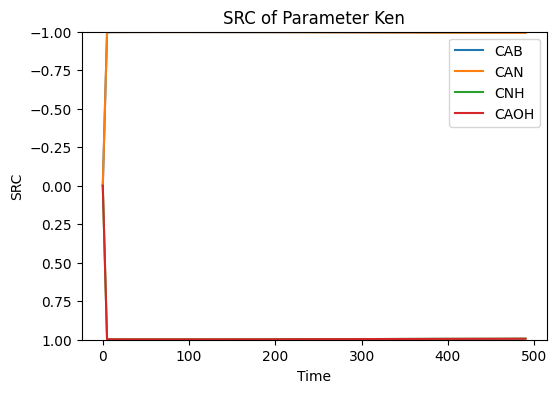

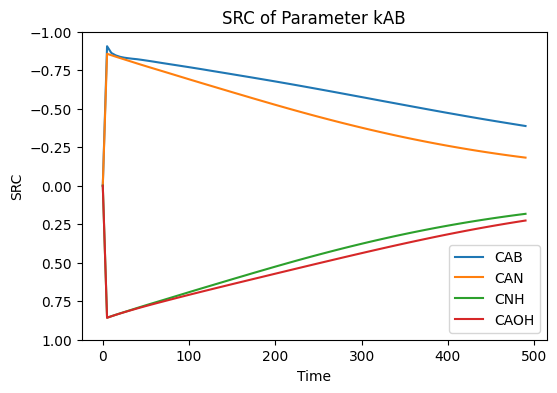

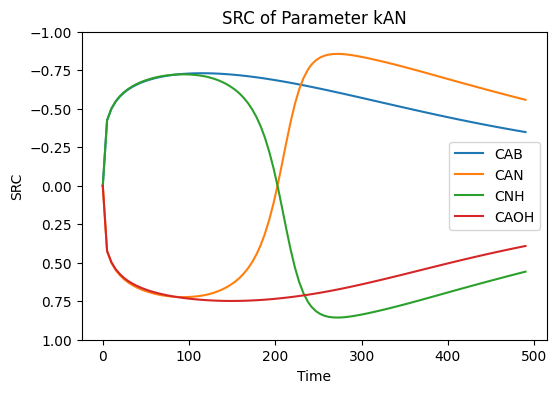

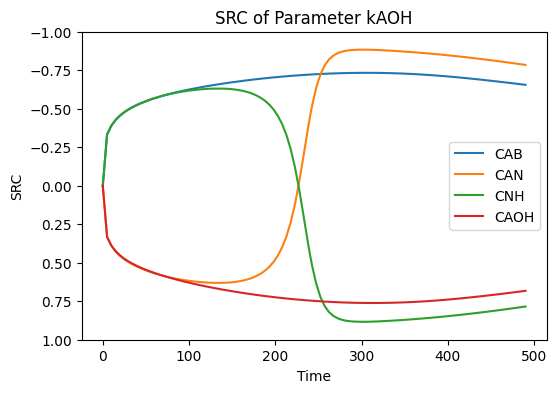

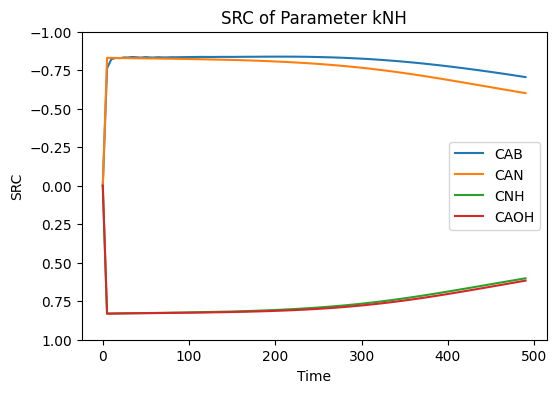

In [25]:
# Run SRC analysis
src_values = src_analysis(sensitivity_results, t)

# Plot SRC results
for i in range(len(base_params)):
    plt.figure(figsize=(6, 4))
    for j, label in enumerate(['CAB', 'CAN', 'CNH', 'CAOH']):
        plt.plot(t, src_values[f'param_{i}'][:, j], label=label)
    plt.ylim((1,-1))
    plt.xlabel('Time')
    plt.ylabel('SRC')
    plt.title(f'SRC of Parameter {labels[i]}')
    plt.legend()
    plt.show()